In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import ast
import os
import hashlib
from ast import literal_eval
from itertools import combinations
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_regression
from sklearn.manifold import TSNE
from sklearn.svm import SVR
from pandas.plotting import parallel_coordinates
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from kmodes.kmodes import KModes
from statsmodels.graphics.mosaicplot import mosaic
from PIL import Image
import colorsys
import webcolors
import xgboost as xgb
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
import ipywidgets as widgets
from IPython.display import display, clear_output
from colormath.color_objects import sRGBColor, LabColor
from colormath.color_conversions import convert_color
from colormath.color_diff import delta_e_cie2000
import Levenshtein as lev


Removing Missing Values

In [2]:

file_path = 'cleaned_file1.xlsx' 
df1 = pd.read_excel(file_path)

print("Original DataFrame:")
print(df1)

# Removing rows where 'skin_tone', 'eye_color', or 'hair_color' is missing
df_cleaned1 = df1.dropna(subset=['skin_tone', 'eye_color', 'hair_color'], how='any')

print("\nCleaned DataFrame:")
print(df_cleaned1)

cleaned_file_path = 'cleaned_missing_file1.xlsx'
df_cleaned1.to_excel(cleaned_file_path, index=False)
print(f"\nCleaned data has been saved to {cleaned_file_path}")


Original DataFrame:
         skin_tone eye_color hair_color
0              NaN     brown      black
1            light     brown     blonde
2              NaN     brown      black
3            light     hazel        NaN
4      lightMedium     brown      brown
...            ...       ...        ...
17105    mediumTan     brown      brown
17106    fairLight       NaN        NaN
17107        light     green      brown
17108        light      blue     blonde
17109        light     brown      black

[17110 rows x 3 columns]

Cleaned DataFrame:
         skin_tone eye_color hair_color
1            light     brown     blonde
4      lightMedium     brown      brown
5            light      blue      brown
6        fairLight     brown      brown
7            light      blue     blonde
...            ...       ...        ...
17104         fair     hazel      brown
17105    mediumTan     brown      brown
17107        light     green      brown
17108        light      blue     blonde
17109        l

Encoding Categorical values

In [3]:

df = pd.read_excel('cleaned_missing_file1.xlsx')

print(df.head())
print(df.info())

# Checking for missing values
print(df.isnull().sum())
df = df.dropna()

# Encoding categorical variables
le = LabelEncoder()
df['skin_tone_encoded'] = le.fit_transform(df['skin_tone'])
df['eye_color_encoded'] = le.fit_transform(df['eye_color'])
df['hair_color_encoded'] = le.fit_transform(df['hair_color'])

df_encoded = df[['skin_tone_encoded', 'eye_color_encoded', 'hair_color_encoded']]
print(df_encoded.head())

     skin_tone eye_color hair_color
0        light     brown     blonde
1  lightMedium     brown      brown
2        light      blue      brown
3    fairLight     brown      brown
4        light      blue     blonde
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16399 entries, 0 to 16398
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   skin_tone   16399 non-null  object
 1   eye_color   16399 non-null  object
 2   hair_color  16399 non-null  object
dtypes: object(3)
memory usage: 384.5+ KB
None
skin_tone     0
eye_color     0
hair_color    0
dtype: int64
   skin_tone_encoded  eye_color_encoded  hair_color_encoded
0                  4                  2                   2
1                  5                  2                   3
2                  4                  1                   3
3                  3                  2                   3
4                  4                  1                   2


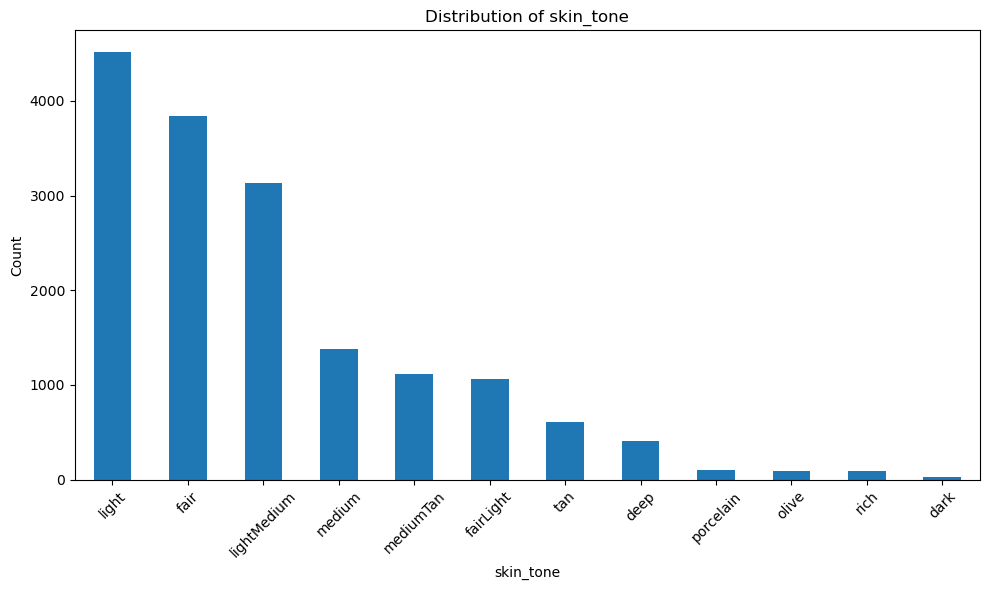

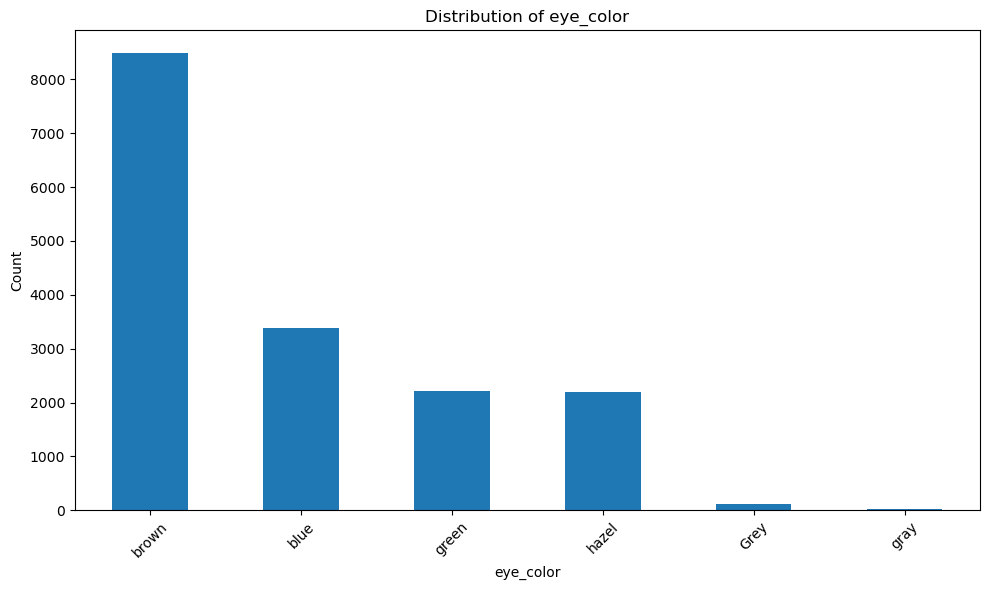

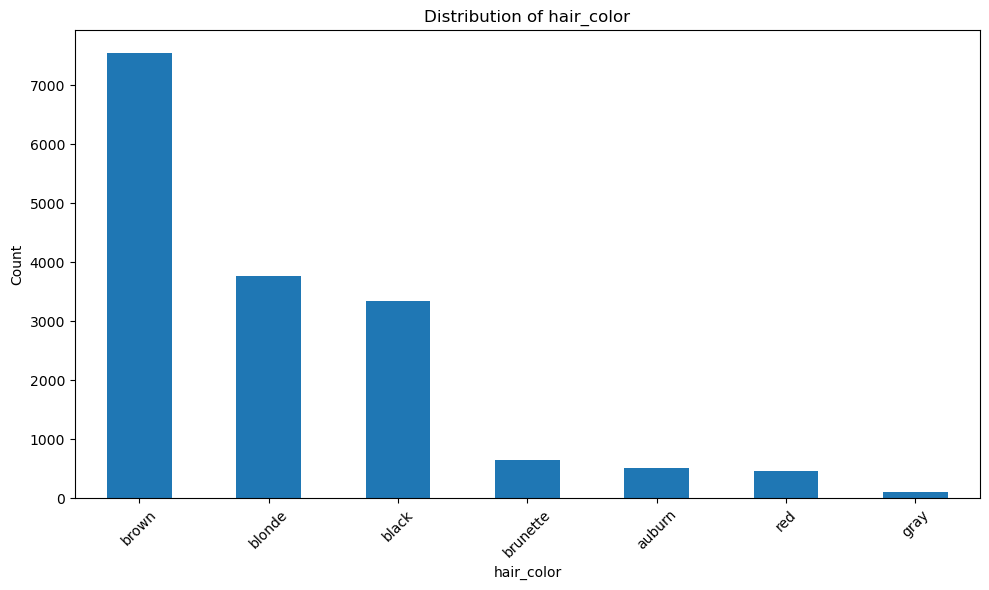


Rare categories in skin_tone (less than 1.0% of data):
['porcelain', 'olive', 'rich', 'dark']

Rare categories in eye_color (less than 1.0% of data):
['Grey', 'gray']

Rare categories in hair_color (less than 1.0% of data):
['gray']


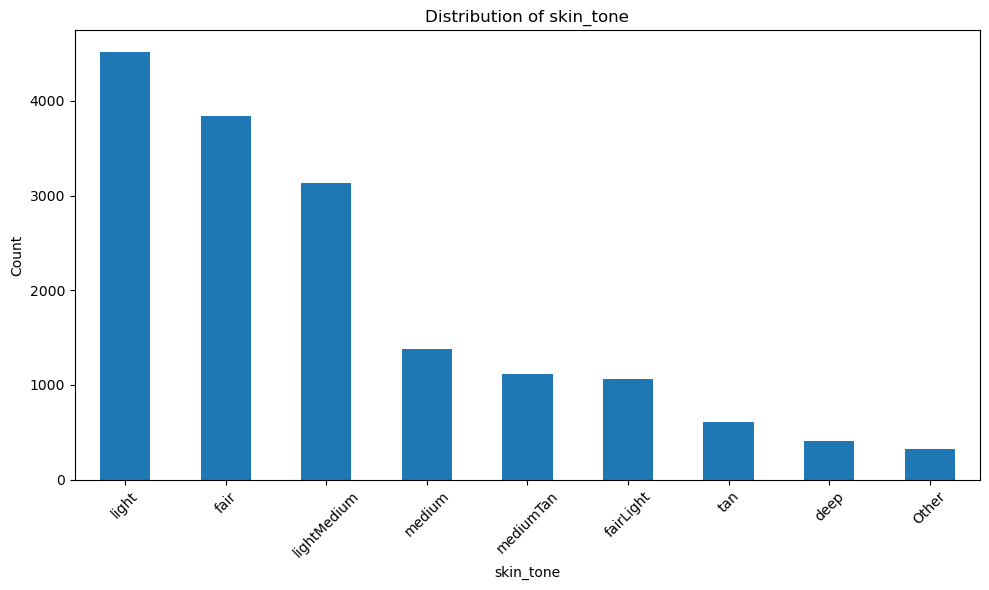

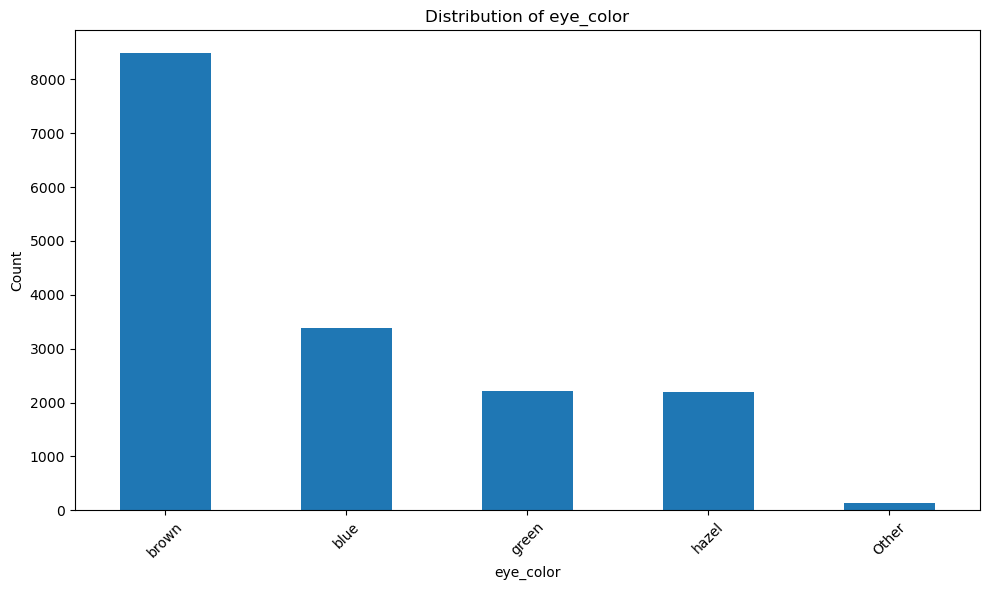

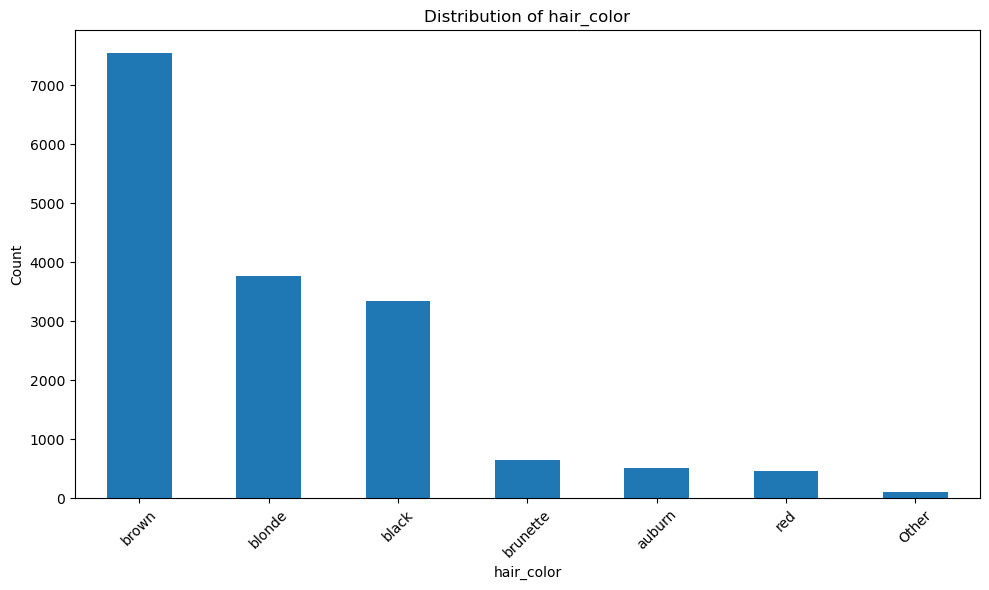


Sample of processed data:
     skin_tone eye_color hair_color
0        light     brown     blonde
1  lightMedium     brown      brown
2        light      blue      brown
3    fairLight     brown      brown
4        light      blue     blonde

Processed data saved to 'processed_data.xlsx'


In [4]:

df = pd.read_excel('cleaned_missing_file1.xlsx')
df = df[df['skin_tone'] != 'notSureST']

# Function to plot category distributions
def plot_category_distribution(df, column):
    plt.figure(figsize=(10, 6))
    df[column].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Plot distributions
for column in ['skin_tone', 'eye_color', 'hair_color']:
    plot_category_distribution(df, column)

# Function to identify rare categories
def identify_rare_categories(df, column, threshold=0.01):
    value_counts = df[column].value_counts(normalize=True)
    rare_categories = value_counts[value_counts < threshold].index.tolist()
    print(f"\nRare categories in {column} (less than {threshold*100}% of data):")
    print(rare_categories)
    return rare_categories

# Identifying rare categories
rare_skin_tones = identify_rare_categories(df, 'skin_tone')
rare_eye_colors = identify_rare_categories(df, 'eye_color')
rare_hair_colors = identify_rare_categories(df, 'hair_color')

# Function to handle rare categories
def handle_rare_categories(df, column, rare_categories, strategy='other'):
    if strategy == 'other':
        df[column] = df[column].apply(lambda x: 'Other' if x in rare_categories else x)
    elif strategy == 'mode':
        mode = df[column].mode()[0]
        df[column] = df[column].apply(lambda x: mode if x in rare_categories else x)
    return df

df = handle_rare_categories(df, 'skin_tone', rare_skin_tones)
df = handle_rare_categories(df, 'eye_color', rare_eye_colors)
df = handle_rare_categories(df, 'hair_color', rare_hair_colors)

# Plotting distributions after handling rare categories
for column in ['skin_tone', 'eye_color', 'hair_color']:
    plot_category_distribution(df, column)

print("\nSample of processed data:")
print(df.head())

df.to_excel('processed_data.xlsx', index=False)
print("\nProcessed data saved to 'processed_data.xlsx'")


In [5]:

excel_file = 'processed_data.xlsx'
df = pd.read_excel(excel_file)

# Defining representative colors for each season
season_colors = {
    'Spring': ['peach', 'coral', 'golden yellow', 'warm green', 'clear turquoise'],
    'Summer': ['pastel blue', 'soft pink', 'lavender', 'soft green', 'grey'],
    'Autumn': ['olive green', 'mustard', 'orange', 'deep red', 'warm brown'],
    'Winter': ['black', 'white', 'navy', 'bright red', 'jewel blue']
}

def determine_season(skin_tone, eye_color, hair_color):
    if skin_tone in ['fair', 'fairLight', 'light']:
        if eye_color in ['blue', 'green', 'hazel'] and hair_color in ['blonde', 'red', 'auburn']:
            return 'Spring'
        else:
            return 'Summer'
    elif skin_tone in ['lightMedium', 'medium', 'mediumTan', 'tan']:
        if eye_color in ['brown', 'hazel', 'green'] and hair_color in ['brown', 'auburn', 'red', 'brunette']:
            return 'Autumn'
        else:
            return 'Spring'
    elif skin_tone == 'deep':
        return 'Winter'
    else:
        if hair_color in ['blonde', 'red'] or eye_color in ['blue', 'green']:
            return 'Spring'
        elif hair_color in ['black', 'brown', 'brunette'] or eye_color in ['brown', 'black']:
            return 'Winter'
        else:
            return 'Autumn'

def create_palette(primary_season):
    palette = []
    palette.extend(random.sample(season_colors[primary_season], 2))
    for season in season_colors:
        if season != primary_season:
            palette.append(random.choice(season_colors[season]))
    return palette

df['primary_season'] = df.apply(lambda row: determine_season(row['skin_tone'], row['eye_color'], row['hair_color']), axis=1)

# Creating color palette for each row
df['color_palette'] = df['primary_season'].apply(create_palette)
print(df)
output_file = 'processed_color_palettes.csv'
df.to_csv(output_file, index=False)
print(f"\nProcessed data saved to '{output_file}'")

         skin_tone eye_color hair_color primary_season  \
0            light     brown     blonde         Summer   
1      lightMedium     brown      brown         Autumn   
2            light      blue      brown         Summer   
3        fairLight     brown      brown         Summer   
4            light      blue     blonde         Spring   
...            ...       ...        ...            ...   
16391         fair     hazel      brown         Summer   
16392    mediumTan     brown      brown         Autumn   
16393        light     green      brown         Summer   
16394        light      blue     blonde         Spring   
16395        light     brown      black         Summer   

                                           color_palette  
0      [lavender, soft green, warm green, orange, white]  
1         [orange, olive green, peach, grey, jewel blue]  
2          [grey, soft green, peach, olive green, black]  
3      [soft pink, pastel blue, clear turquoise, deep...  
4       

Mutual Information Scores:
      Feature  Mutual Information
2  hair_color            0.424835
0   skin_tone            0.334636
1   eye_color            0.106175


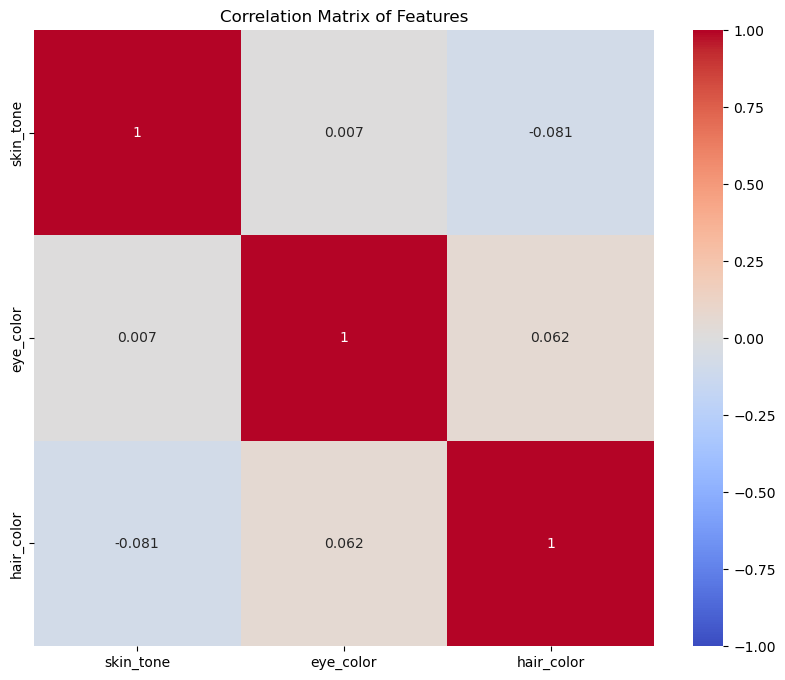


Highly Correlated Features:

Unique feature combinations:
    skin_tone eye_color hair_color  Count
0       Other     Other      Other      1
1       Other     Other      black      1
2       Other     Other     blonde      1
3       Other      blue      black      2
4       Other      blue     blonde     19
..        ...       ...        ...    ...
228       tan     hazel      black      6
229       tan     hazel     blonde      1
230       tan     hazel      brown      2
231       tan     hazel   brunette      6
232       tan     hazel        red      1

[233 rows x 4 columns]





In [6]:

data = pd.read_csv('processed_color_palettes.csv')

# Separating features and target
X = data[['skin_tone', 'eye_color', 'hair_color']]
y = data['color_palette']#Target Variable

def encode_categorical(df):
    le = LabelEncoder()
    return df.apply(lambda col: le.fit_transform(col.astype(str)))

X_encoded = encode_categorical(X)

if y.dtype == 'object':
    y_encoded = LabelEncoder().fit_transform(y)
else:
    y_encoded = y

# Calculating mutual information scores
mi_scores = mutual_info_regression(X_encoded, y_encoded)

mi_df = pd.DataFrame({'Feature': X.columns, 'Mutual Information': mi_scores})
mi_df = mi_df.sort_values('Mutual Information', ascending=False)
print("Mutual Information Scores:")
print(mi_df)

# correlation matrix
corr_matrix = X_encoded.corr()

#  heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation Matrix of Features')
plt.show()

# Checking for perfect correlations between features
high_corr = np.where(np.abs(corr_matrix) > 0.95)
high_corr_list = [(X.columns[x], X.columns[y], corr_matrix.iloc[x, y]) 
                  for x, y in zip(*high_corr) if x != y and x < y]
print("\nHighly Correlated Features:")
for feat1, feat2, corr in high_corr_list:
    print(f"{feat1} and {feat2}: {corr}")

# Checking for unique combinations
unique_combinations = X.groupby(X.columns.tolist()).size().reset_index(name='Count')
print("\nUnique feature combinations:")
print(unique_combinations)

# Checking if any single feature or combination of features perfectly predicts the target
for i in range(1, len(X.columns) + 1):
    for combo in combinations(X.columns, i):
        grouped = y.groupby([X[col] for col in combo])
        if grouped.nunique().eq(1).all():
            print(f"\nWarning: The combination of features {combo} perfectly predicts the target.")

# Checking for constant or near-constant features
constant_features = []
for col in X.columns:
    if X[col].nunique() == 1:
        constant_features.append(col)
    elif X[col].nunique() / len(X) < 0.01:  # Less than 1% unique values
        print(f"\nWarning: Feature '{col}' has very low variance.")

if constant_features:
    print("\nConstant features:")
    print(constant_features)

In [7]:
print(f"Number of unique color palettes: {y.nunique()}")
palette_counts = y.value_counts()
print("Top 10 most common color palettes:")
print(palette_counts.head(10))
if y.nunique() == len(unique_combinations):
    print("Warning: The number of unique palettes matches the number of unique feature combinations.")

Number of unique color palettes: 6951
Top 10 most common color palettes:
['soft pink', 'pastel blue', 'clear turquoise', 'orange', 'black']      9
['lavender', 'pastel blue', 'warm green', 'orange', 'jewel blue']       9
['soft green', 'lavender', 'peach', 'orange', 'bright red']             9
['coral', 'warm green', 'grey', 'deep red', 'navy']                     8
['peach', 'warm green', 'soft green', 'mustard', 'navy']                8
['warm green', 'peach', 'lavender', 'orange', 'white']                  8
['golden yellow', 'warm green', 'grey', 'deep red', 'navy']             8
['grey', 'soft green', 'warm green', 'warm brown', 'white']             8
['pastel blue', 'soft green', 'clear turquoise', 'mustard', 'navy']     8
['grey', 'lavender', 'clear turquoise', 'olive green', 'jewel blue']    8
Name: color_palette, dtype: int64


In [8]:

df = pd.read_csv('processed_color_palettes.csv')

# Function to generate a unique name for each color palette
def generate_palette_name(colors):
    # Create a hash of the palette to ensure uniqueness
    palette_hash = hashlib.md5(colors.encode()).hexdigest()
    # Generate a simple name based on the hash (e.g., first 8 characters)
    return f'Palette_{palette_hash[:8]}'

# Apply the function to the 'color_palette' column
df['palette_name'] = df['color_palette'].apply(lambda x: generate_palette_name(x))

# Save the updated DataFrame to a new CSV file
df.to_csv('processed_color_palettes_with_names.csv', index=False)

# Print the updated DataFrame
print(df[['color_palette', 'palette_name']].drop_duplicates())


                                           color_palette      palette_name
0      ['lavender', 'soft green', 'warm green', 'oran...  Palette_c196d413
1      ['orange', 'olive green', 'peach', 'grey', 'je...  Palette_99f7cd15
2      ['grey', 'soft green', 'peach', 'olive green',...  Palette_2bc1b713
3      ['soft pink', 'pastel blue', 'clear turquoise'...  Palette_5c43f8f1
4      ['warm green', 'coral', 'lavender', 'orange', ...  Palette_a5e5c593
...                                                  ...               ...
16367  ['bright red', 'jewel blue', 'coral', 'soft gr...  Palette_0c443e69
16370  ['pastel blue', 'grey', 'clear turquoise', 'ol...  Palette_805aff30
16373  ['black', 'jewel blue', 'warm green', 'pastel ...  Palette_8c301276
16374  ['orange', 'warm brown', 'peach', 'pastel blue...  Palette_b6d509bc
16388  ['golden yellow', 'clear turquoise', 'soft gre...  Palette_858bc744

[6951 rows x 2 columns]


In [9]:
# Function to add noise to a single color palette
def add_noise_to_palette(palette_str):
    try:
        palette = ast.literal_eval(palette_str)
        if not isinstance(palette, list):
            return palette_str
        
        noisy_palette = []
        for color in palette:
            noise = ''.join(np.random.choice(['light ', 'dark ', 'bright ', 'muted ', ''], p=[0.2, 0.2, 0.2, 0.2, 0.2]))
            noisy_palette.append(f"{noise}{color}")
        
        return str(noisy_palette)
    except:
        return palette_str


df['palette_name'] = df['color_palette'].apply(generate_palette_name)
df['noisy_color_palette'] = df['color_palette'].apply(add_noise_to_palette)
df['noisy_palette_name'] = df['noisy_color_palette'].apply(generate_palette_name)
df.to_csv('processed_color_palettes_with_noise.csv', index=False)

print(df[['color_palette', 'palette_name', 'noisy_color_palette', 'noisy_palette_name']])

                                           color_palette      palette_name  \
0      ['lavender', 'soft green', 'warm green', 'oran...  Palette_c196d413   
1      ['orange', 'olive green', 'peach', 'grey', 'je...  Palette_99f7cd15   
2      ['grey', 'soft green', 'peach', 'olive green',...  Palette_2bc1b713   
3      ['soft pink', 'pastel blue', 'clear turquoise'...  Palette_5c43f8f1   
4      ['warm green', 'coral', 'lavender', 'orange', ...  Palette_a5e5c593   
...                                                  ...               ...   
16391  ['soft pink', 'grey', 'clear turquoise', 'oliv...  Palette_3882d698   
16392  ['deep red', 'warm brown', 'warm green', 'lave...  Palette_c40a9c29   
16393  ['soft green', 'pastel blue', 'coral', 'deep r...  Palette_8f351fe8   
16394  ['peach', 'golden yellow', 'soft pink', 'musta...  Palette_9c9f0a6a   
16395  ['lavender', 'pastel blue', 'coral', 'olive gr...  Palette_0709dbb6   

                                     noisy_color_palette noisy_

C:\Users\Dell\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Dell\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Dell\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\Dell\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_

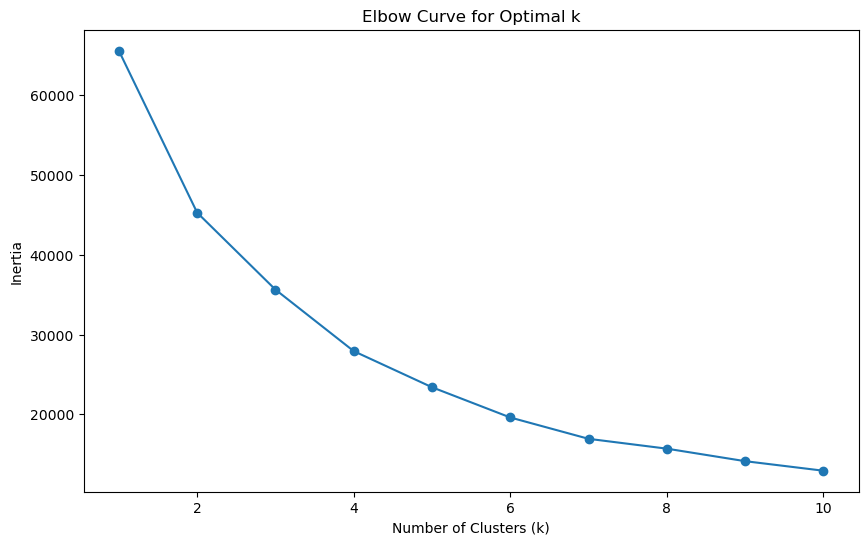

C:\Users\Dell\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


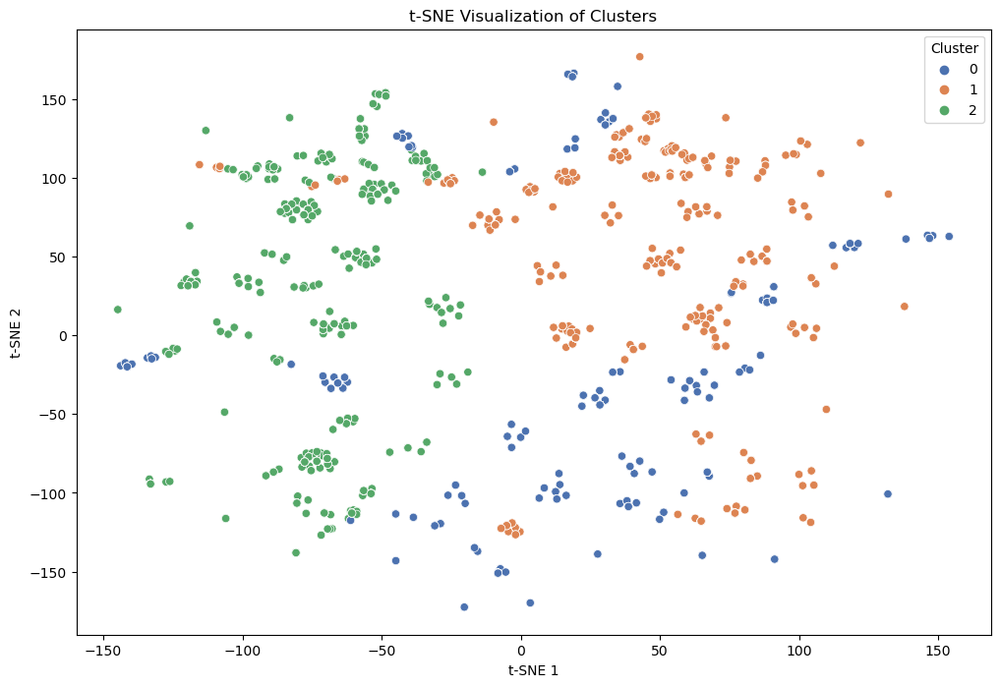


Cluster 0:
skin_tone: 4
eye_color: 4
hair_color: 4
primary_season: 2

Cluster 1:
skin_tone: 4
eye_color: 2
hair_color: 4
primary_season: 2

Cluster 2:
skin_tone: 5
eye_color: 2
hair_color: 4
primary_season: 0


In [10]:

df = pd.read_csv('processed_color_palettes_with_noise.csv')

# Selecting features for clustering
features = ['skin_tone', 'eye_color', 'hair_color', 'primary_season']

le = LabelEncoder()
for feature in features:
    df[feature] = le.fit_transform(df[feature])

X = df[features].values

# Normalizing the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Elbow curve to find optimal number of clusters
inertias = []
max_clusters = 10

for k in range(1, max_clusters + 1):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)

# Plotting the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_clusters + 1), inertias, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.title('Elbow Curve for Optimal k')
plt.show()

# Based on the elbow curve, choose the optimal number of clusters
optimal_clusters = 3

# Performing K-means clustering with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
df['cluster'] = kmeans.fit_predict(X_scaled)

# Performing t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(X_scaled)

# Creating a DataFrame with t-SNE results
df_tsne = pd.DataFrame(data=tsne_results, columns=['t-SNE 1', 't-SNE 2'])
df_tsne['cluster'] = df['cluster']

plt.figure(figsize=(12, 8))
sns.scatterplot(data=df_tsne, x='t-SNE 1', y='t-SNE 2', hue='cluster', palette='deep')
plt.title('t-SNE Visualization of Clusters')
plt.legend(title='Cluster')
plt.show()

for cluster in range(optimal_clusters):
    print(f"\nCluster {cluster}:")
    cluster_data = df[df['cluster'] == cluster]
    for feature in features:
        print(f"{feature}: {cluster_data[feature].mode().values[0]}")

<Figure size 1200x600 with 0 Axes>

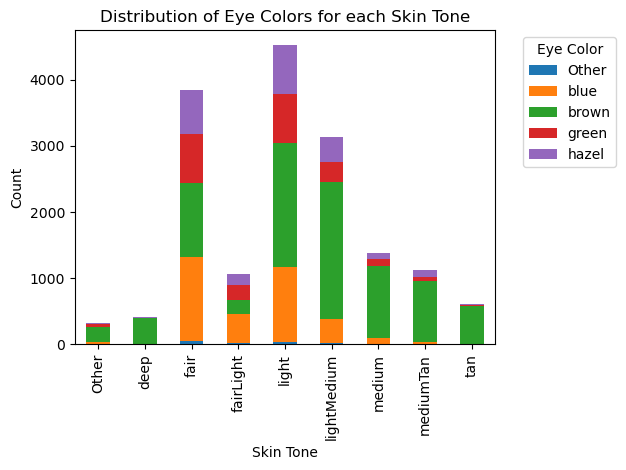

<Figure size 1200x600 with 0 Axes>

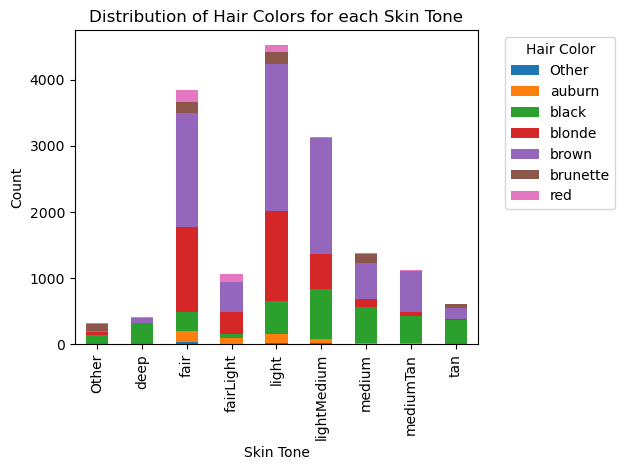

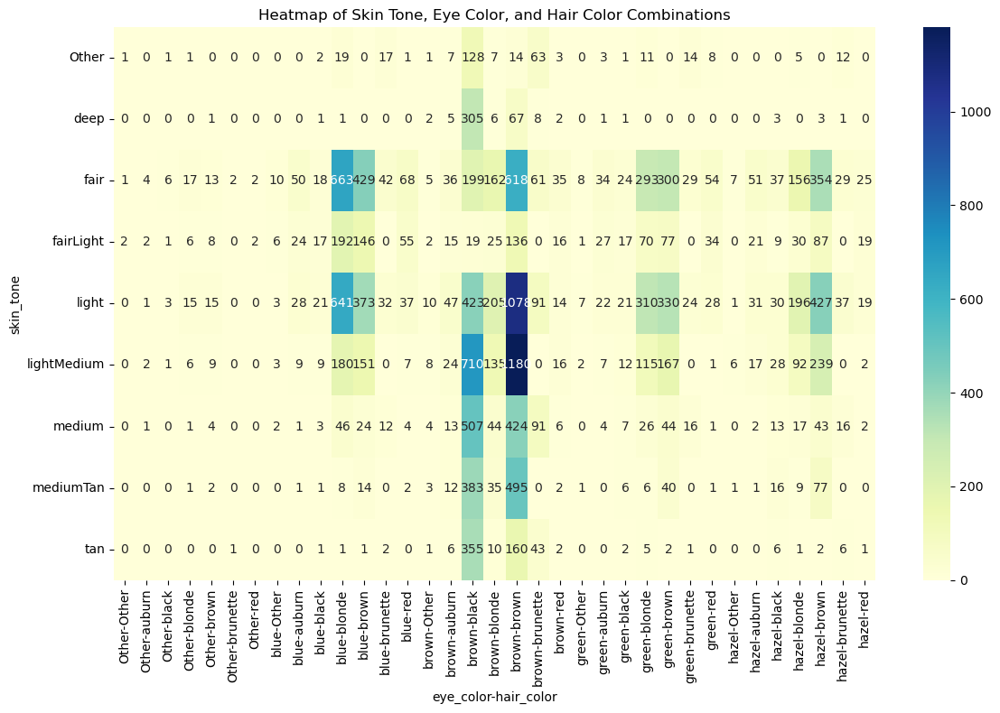

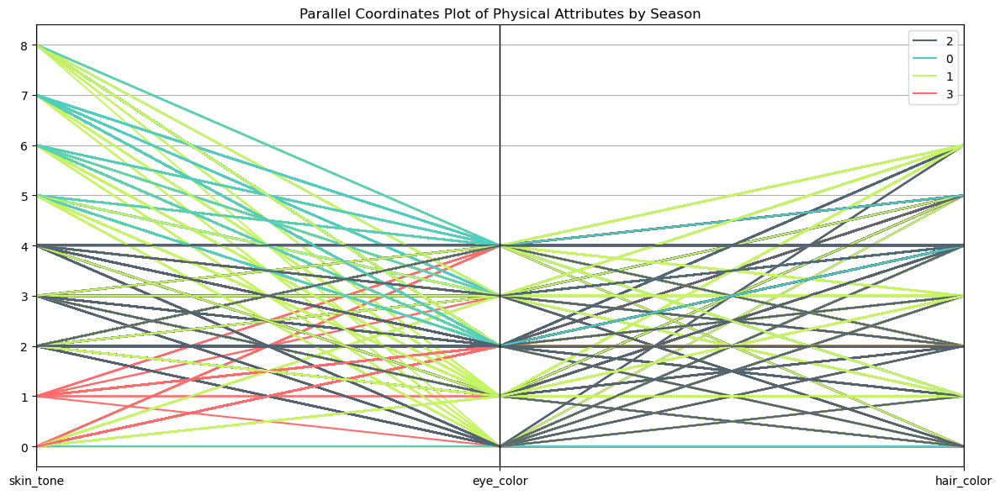

<Figure size 1200x600 with 0 Axes>

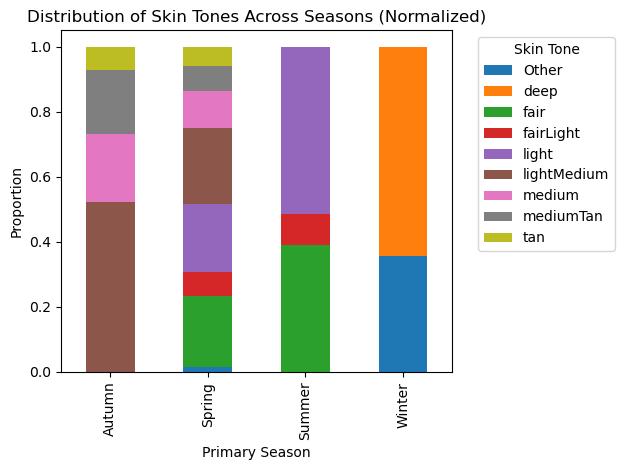

In [11]:

df = pd.read_csv('processed_color_palettes_with_noise.csv')

# 1. Stacked Bar Charts
plt.figure(figsize=(12, 6))
df_stacked = df.groupby(['skin_tone', 'eye_color']).size().unstack()
df_stacked.plot(kind='bar', stacked=True)
plt.title('Distribution of Eye Colors for each Skin Tone')
plt.xlabel('Skin Tone')
plt.ylabel('Count')
plt.legend(title='Eye Color', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
df_stacked = df.groupby(['skin_tone', 'hair_color']).size().unstack()
df_stacked.plot(kind='bar', stacked=True)
plt.title('Distribution of Hair Colors for each Skin Tone')
plt.xlabel('Skin Tone')
plt.ylabel('Count')
plt.legend(title='Hair Color', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# 2. Heatmap
plt.figure(figsize=(12, 8))
heatmap_data = pd.crosstab(df['skin_tone'], [df['eye_color'], df['hair_color']])
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Heatmap of Skin Tone, Eye Color, and Hair Color Combinations')
plt.tight_layout()
plt.show()

# 3. Parallel Coordinates Plot
le = LabelEncoder()
df_encoded = df.copy()

cols_to_encode = df.select_dtypes(include=['object']).columns
cols_to_encode = [col for col in cols_to_encode if col not in ['noisy_color_palette', 'noisy_palette_name']]

for col in cols_to_encode:
    df_encoded[col] = le.fit_transform(df[col])

plot_cols = ['skin_tone', 'eye_color', 'hair_color', 'primary_season']

plt.figure(figsize=(12, 6))
parallel_coordinates(df_encoded[plot_cols], 'primary_season', color=('#556270', '#4ECDC4', '#C7F464', '#FF6B6B'))
plt.title('Parallel Coordinates Plot of Physical Attributes by Season')
plt.tight_layout()
plt.show()


# Alternative: Normalized Stacked Bar Plot
plt.figure(figsize=(12, 6))
df_grouped = df.groupby(['primary_season', 'skin_tone']).size().unstack()
df_grouped_normalized = df_grouped.div(df_grouped.sum(axis=1), axis=0)
df_grouped_normalized.plot(kind='bar', stacked=True)
plt.title('Distribution of Skin Tones Across Seasons (Normalized)')
plt.xlabel('Primary Season')
plt.ylabel('Proportion')
plt.legend(title='Skin Tone', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



In [12]:
image_folder = 'Outfit_images'
csv_filename = 'image_features.csv'
num_colors = 5

def extract_color_palette(image_path, num_colors=5, max_pixels=10000):
    """
    Extracts a representative color palette from an image using K-means clustering.
    """
    with Image.open(image_path) as img:
        img = img.convert('RGB')
        
        # Resizing image if it's too large
        if img.width * img.height > max_pixels:
            img.thumbnail((int(np.sqrt(max_pixels * img.width / img.height)), 
                           int(np.sqrt(max_pixels * img.height / img.width))))
        
        # Converting image to numpy array
        img_array = np.array(img)
        pixels = img_array.reshape(-1, 3)
        
        # Performing k-means clustering
        kmeans = KMeans(n_clusters=num_colors, random_state=42, n_init=10)
        kmeans.fit(pixels)
        
        # Getting the colors and their percentages
        colors = kmeans.cluster_centers_.astype(int)
        labels = kmeans.labels_
        
        unique, counts = np.unique(labels, return_counts=True)
        percentages = counts / len(labels)

        sorted_indices = np.argsort(percentages)[::-1]
        colors = colors[sorted_indices]
        percentages = percentages[sorted_indices]
        
       
        return [tuple(color) for color in colors], percentages.tolist()

def save_palette_to_csv(image_data, csv_filename):
    df = pd.DataFrame(image_data)
    df.to_csv(csv_filename, index=False)


image_data = []
for filename in os.listdir(image_folder):
    if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
        file_path = os.path.join(image_folder, filename)
        palette, percentages = extract_color_palette(file_path, num_colors)
        image_data.append({
            'filename': filename,
            'color_palette': palette,
            'color_percentages': percentages
        })


save_palette_to_csv(image_data, csv_filename)

print(f"Color palettes extracted and saved to {csv_filename}")

Color palettes extracted and saved to image_features.csv


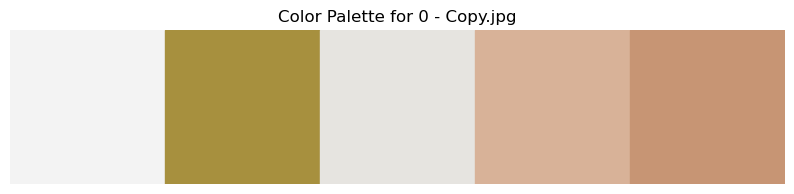

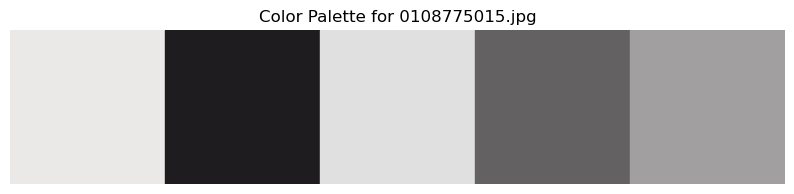

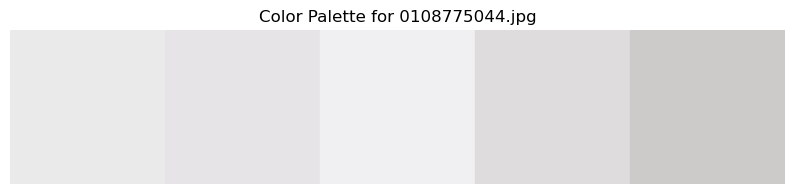

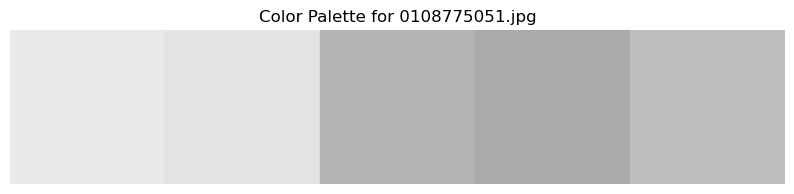

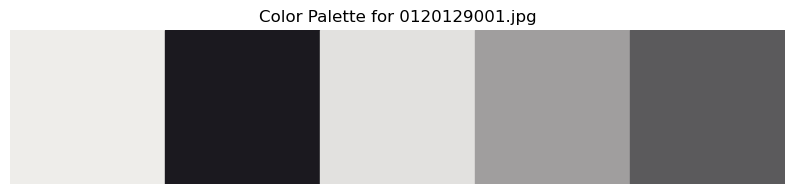

...

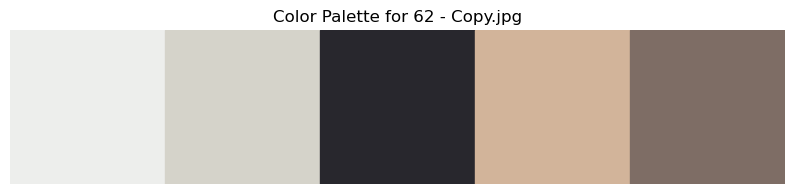

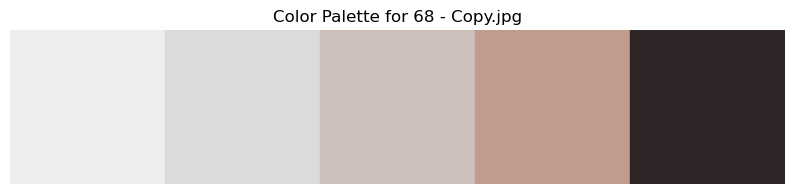

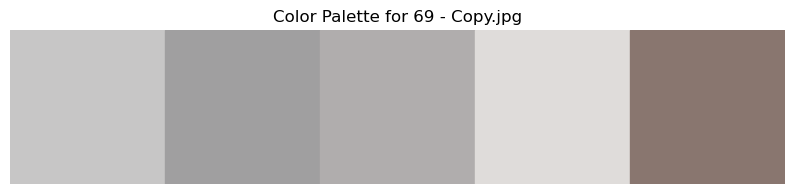

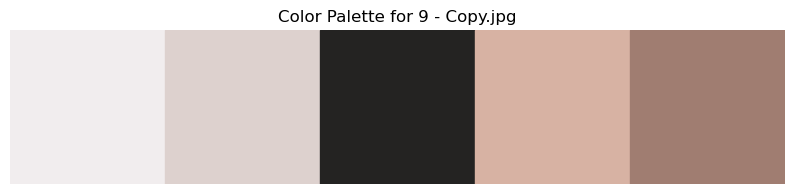

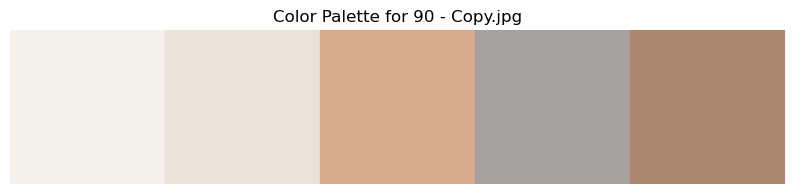

In [13]:

def normalize_color(color):
    return tuple(max(0, min(c, 255))/255 for c in color)

def plot_color_palette(palette, percentages, filename):
    plt.figure(figsize=(10, 2))
    
    # Normalizing colors to 0-1 range, clamping invalid values
    normalized_palette = [normalize_color(color) for color in palette]
    
    for i, (color, pct) in enumerate(zip(normalized_palette, percentages)):
        plt.axvspan(i, i+1, color=color)
    
    plt.xlim(0, len(palette))
    plt.ylim(0, 1)
    plt.axis('off')
    plt.title(f'Color Palette for {filename}')
    plt.show()

df = pd.read_csv('image_features.csv')

for index, row in df.iterrows():
    palette = ast.literal_eval(row['color_palette'])
    percentages = ast.literal_eval(row['color_percentages'])
    plot_color_palette(palette, percentages, row['filename'])

In [14]:
def compare_palettes(palette1, palette2):
    total_diff = 0
    for color1, color2 in zip(palette1, palette2):
        rgb1 = sRGBColor(color1[0]/255, color1[1]/255, color1[2]/255)
        rgb2 = sRGBColor(color2[0]/255, color2[1]/255, color2[2]/255)
        lab1 = convert_color(rgb1, LabColor)
        lab2 = convert_color(rgb2, LabColor)
        total_diff += delta_e_cie2000(lab1, lab2)
    return total_diff / len(palette1)

C:\Users\Dell\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


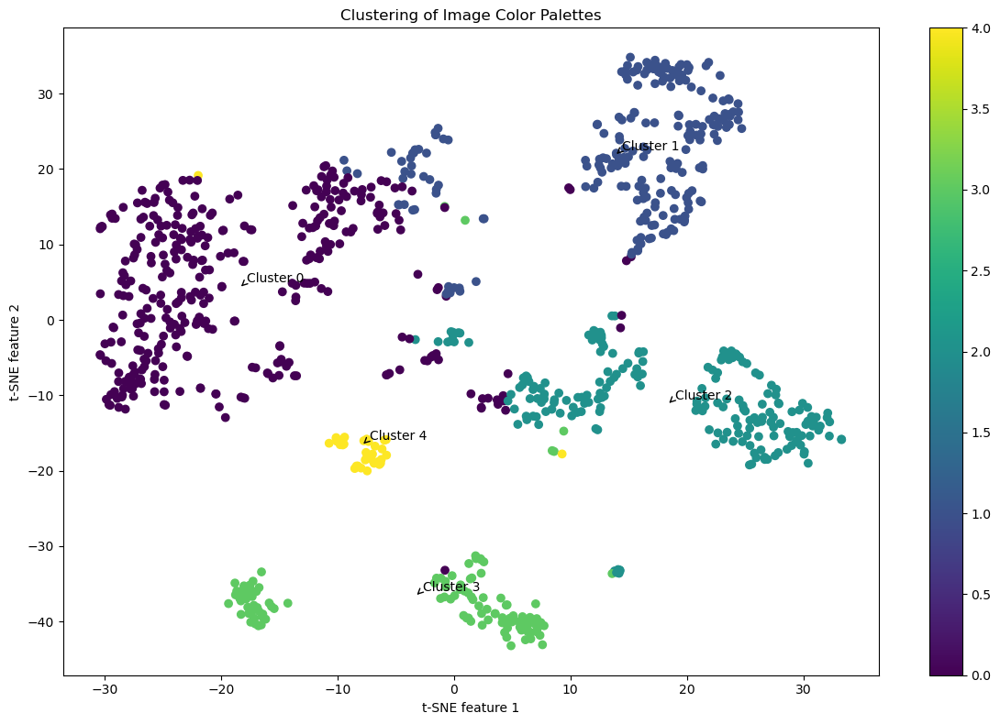


Example images from Cluster 0:
['0 - Copy.jpg', '0108775044.jpg', '0108775051.jpg', '0129085026.jpg', '0129085027.jpg']

Example images from Cluster 1:
['0145872052.jpg', '0176209023.jpg', '0176209040.jpg', '0176209044.jpg', '0189616007.jpg']

Example images from Cluster 2:
['0145872053.jpg', '0176209025.jpg', '0176209039.jpg', '0176209046.jpg', '0189616008.jpg']

Example images from Cluster 3:
['0108775015.jpg', '0120129001.jpg', '0120129014.jpg', '0120129018.jpg', '0120129025.jpg']

Example images from Cluster 4:
['0145872001.jpg', '0145872051.jpg', '0176209033.jpg', '0189691033.jpg', '0189691075.jpg']


In [15]:

df = pd.read_csv('image_features.csv')

palettes = [ast.literal_eval(palette_str) for palette_str in df['color_palette']]

palette_features = []
for palette in palettes:
    normalized_palette = [max(0, min(c, 255))/255 for color in palette for c in color]
    palette_features.append(normalized_palette)

palette_features = np.array(palette_features)

# Performing K-means clustering
n_clusters = 5 
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(palette_features)

df['cluster'] = clusters 

tsne = TSNE(n_components=2, random_state=42)
palette_2d = tsne.fit_transform(palette_features)

# scatter plot
plt.figure(figsize=(12, 8))
scatter = plt.scatter(palette_2d[:, 0], palette_2d[:, 1], c=clusters, cmap='viridis')
plt.colorbar(scatter)
plt.title('Clustering of Image Color Palettes')
plt.xlabel('t-SNE feature 1')
plt.ylabel('t-SNE feature 2')

for i in range(n_clusters):
    cluster_points = palette_2d[clusters == i]
    centroid = np.mean(cluster_points, axis=0)
    plt.annotate(f'Cluster {i}', xy=centroid, xytext=centroid + np.array([0.5, 0.5]),
                 arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.3'))

plt.tight_layout()
plt.show()

for i in range(n_clusters):
    print(f"\nExample images from Cluster {i}:")
    print(df[df['cluster'] == i]['filename'].head().tolist())

df.to_csv('clustered_images.csv', index=False)

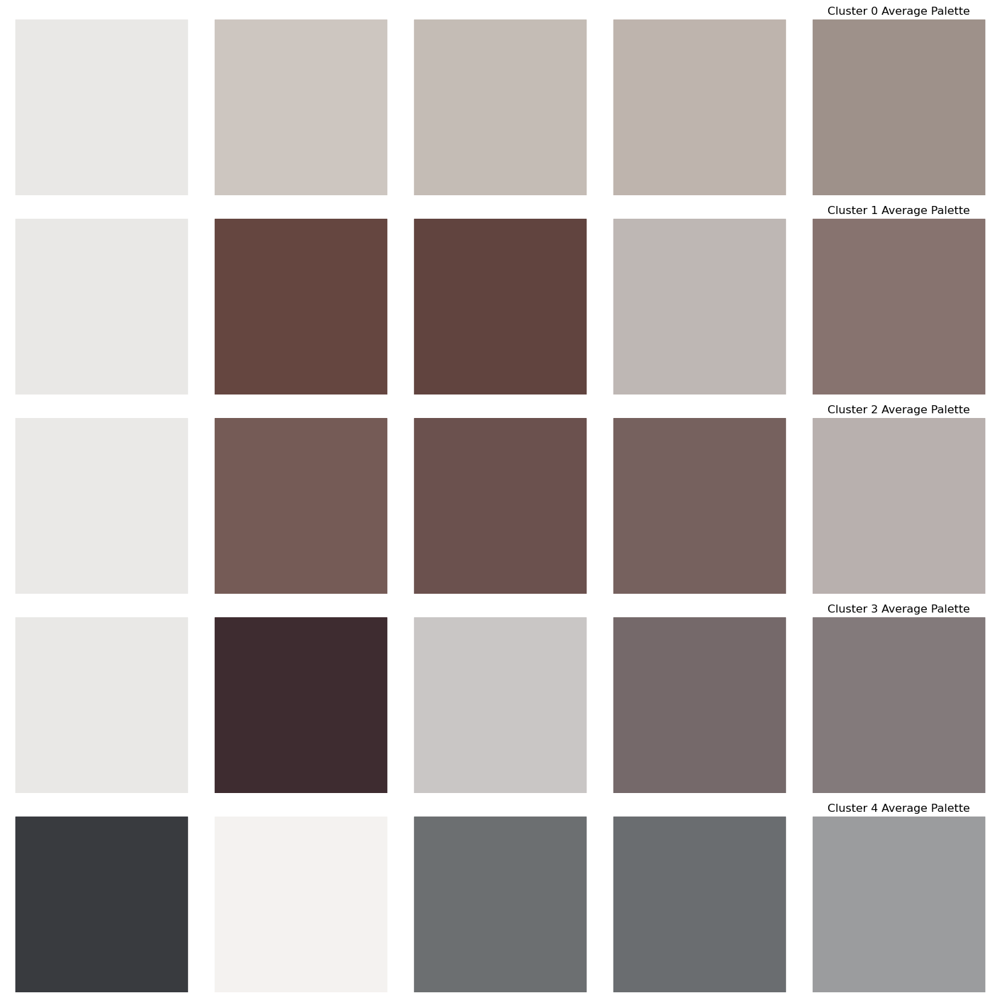

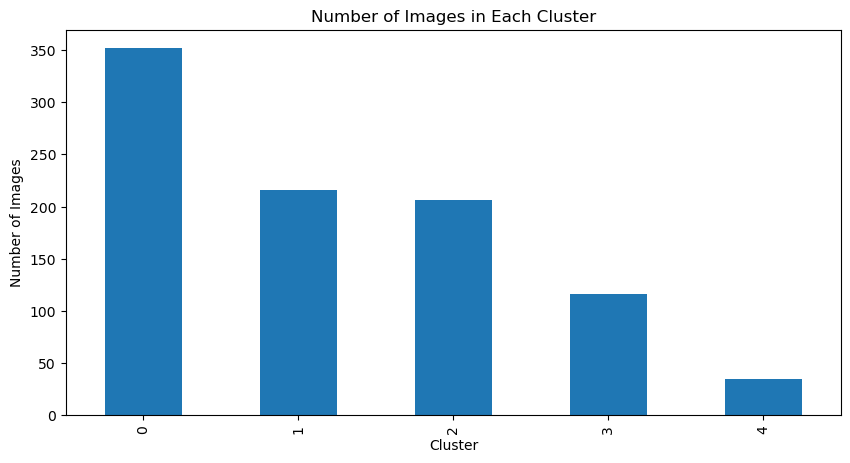

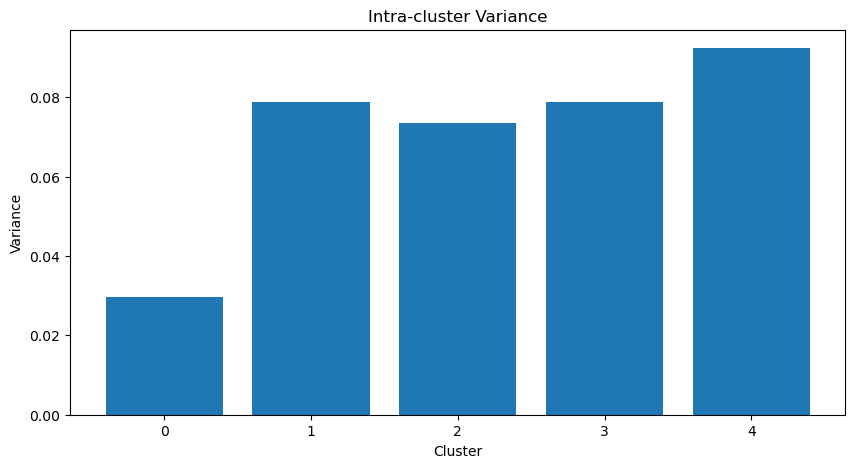

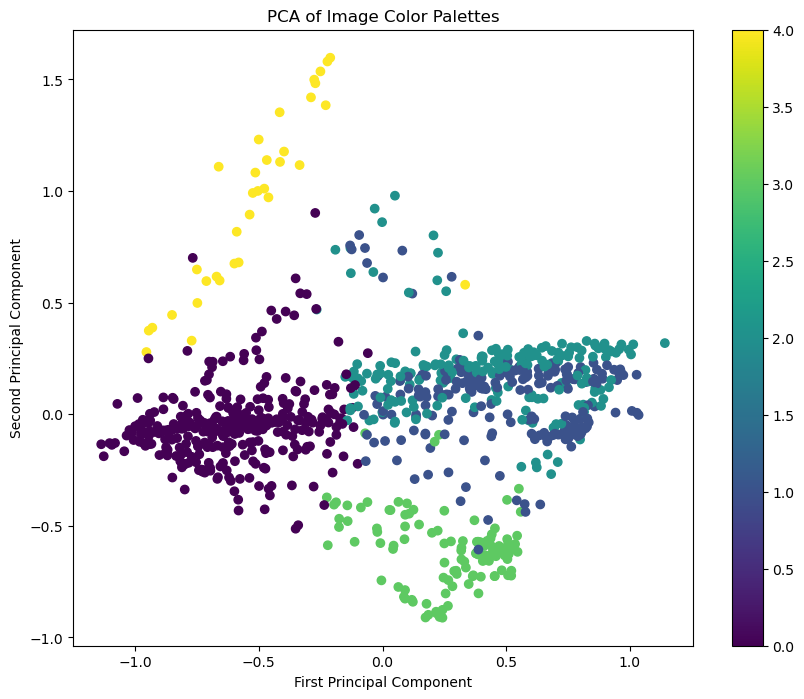

In [16]:
# 1. Color Palette Visualization
plt.figure(figsize=(15, 3*n_clusters))
for i in range(n_clusters):
    cluster_palettes = [ast.literal_eval(p) for p in df[df['cluster'] == i]['color_palette']]
    avg_palette = np.mean(cluster_palettes, axis=0)
    for j, color in enumerate(avg_palette):
        plt.subplot(n_clusters, 5, i*5 + j + 1)
        plt.axvspan(0, 1, color=[max(0, min(c/255, 1)) for c in color])
        plt.axis('off')
    plt.title(f'Cluster {i} Average Palette')
plt.tight_layout()
plt.show()

# 2. Cluster Size Distribution
plt.figure(figsize=(10, 5))
df['cluster'].value_counts().sort_index().plot(kind='bar')
plt.title('Number of Images in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Images')
plt.show()

# 3. Intra-cluster Variance
intra_cluster_variances = [np.var(palette_features[clusters == i]) for i in range(n_clusters)]
plt.figure(figsize=(10, 5))
plt.bar(range(n_clusters), intra_cluster_variances)
plt.title('Intra-cluster Variance')
plt.xlabel('Cluster')
plt.ylabel('Variance')
plt.show()

# 4. PCA Visualization
pca = PCA(n_components=2)
palette_2d_pca = pca.fit_transform(palette_features)
plt.figure(figsize=(10, 8))
scatter = plt.scatter(palette_2d_pca[:, 0], palette_2d_pca[:, 1], c=clusters, cmap='viridis')
plt.colorbar(scatter)
plt.title('PCA of Image Color Palettes')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.show()


XGB

In [36]:

df = pd.read_csv('processed_color_palettes_with_noise.csv')
outfit_data = pd.read_csv('image_features.csv')

# Converting color_palette strings to lists
df['color_palette'] = df['color_palette'].apply(literal_eval)
df['noisy_color_palette'] = df['noisy_color_palette'].apply(literal_eval)

def color_to_rgb(color_name):
    try:
        rgb = webcolors.name_to_rgb(color_name.lower())
        return rgb
    except ValueError:
        return [128, 128, 128]


df['color_palette_rgb'] = df['color_palette'].apply(lambda x: [color_to_rgb(color) for color in x])
df['noisy_color_palette_rgb'] = df['noisy_color_palette'].apply(lambda x: [color_to_rgb(color) for color in x])


df['color_palette_flat'] = df['color_palette_rgb'].apply(lambda x: [item for sublist in x for item in sublist])
df['noisy_color_palette_flat'] = df['noisy_color_palette_rgb'].apply(lambda x: [item for sublist in x for item in sublist])

# Combining original and noisy data
df_combined = pd.concat([
    df[['skin_tone', 'eye_color', 'hair_color', 'color_palette_flat']],
    df[['skin_tone', 'eye_color', 'hair_color', 'noisy_color_palette_flat']].rename(columns={'noisy_color_palette_flat': 'color_palette_flat'})
])

# Preparing features and target
X = df_combined[['skin_tone', 'eye_color', 'hair_color']]
y = np.array(df_combined['color_palette_flat'].tolist())

# Splitting the data to test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


categorical_features = ['skin_tone', 'eye_color', 'hair_color']
categorical_transformer = OneHotEncoder(drop='first', sparse=False)

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_features)
    ])

# Fitting and transforming the input features
X_train_encoded = preprocessor.fit_transform(X_train)
X_test_encoded = preprocessor.transform(X_test)

y_scaler = MinMaxScaler()
y_train_normalized = y_scaler.fit_transform(y_train)
y_test_normalized = y_scaler.transform(y_test)

# Creating and training the XGBoost model
model = xgb.XGBRegressor(n_estimators=1000, learning_rate=0.01, max_depth=5, random_state=42)
model.fit(X_train_encoded, y_train_normalized)

def increase_saturation(rgb, factor=1.5):
    r, g, b = rgb
    r = int(min(255, r * factor))
    g = int(min(255, g * factor))
    b = int(min(255, b * factor))
    return [r, g, b]

def get_predicted_palette(skin_tone, eye_color, hair_color):
    skin_tone = skin_tone.lower().strip()
    eye_color = eye_color.lower().strip()
    hair_color = hair_color.lower().strip()

    unique_skin_tones = X['skin_tone'].str.lower().str.strip().unique()
    unique_eye_colors = X['eye_color'].str.lower().str.strip().unique()
    unique_hair_colors = X['hair_color'].str.lower().str.strip().unique()

 
    closest_skin_tone = min(unique_skin_tones, key=lambda x: lev.distance(x, skin_tone))
    closest_eye_color = min(unique_eye_colors, key=lambda x: lev.distance(x, eye_color))
    closest_hair_color = min(unique_hair_colors, key=lambda x: lev.distance(x, hair_color))

    print(f"Using: Skin Tone: {closest_skin_tone}, Eye Color: {closest_eye_color}, Hair Color: {closest_hair_color}")

    input_features = pd.DataFrame([[closest_skin_tone, closest_eye_color, closest_hair_color]], 
                                  columns=['skin_tone', 'eye_color', 'hair_color'])

    input_encoded = preprocessor.transform(input_features)
    
    predicted_palette_normalized = model.predict(input_encoded)[0]
    
    # Directly scale between 0 and 255
    predicted_palette_flat = y_scaler.inverse_transform([predicted_palette_normalized])[0]
    
    # Ensuring values are within 0-255 range
    predicted_palette_flat = np.clip(predicted_palette_flat, 0, 255)
    
    # Increasing saturation
    predicted_palette_rgb = [predicted_palette_flat[i:i+3] for i in range(0, len(predicted_palette_flat), 3)]
    predicted_palette_rgb = [increase_saturation(color) for color in predicted_palette_rgb]
    
    return predicted_palette_rgb

def prepare_data(outfit_data):
    required_columns = ['filename', 'color_palette']
    missing_columns = [col for col in required_columns if col not in outfit_data.columns]
    if missing_columns:
        raise ValueError(f"Missing required columns in outfit_data: {', '.join(missing_columns)}")


    if isinstance(outfit_data['color_palette'].iloc[0], list):
        return outfit_data
    

    try:
        outfit_data['color_palette'] = outfit_data['color_palette'].apply(literal_eval)
    except ValueError:
      
        outfit_data['color_palette'] = outfit_data['color_palette'].apply(lambda x: eval(x) if isinstance(x, str) else x)
    
    return outfit_data

def rgb_to_hsl(rgb):
    """Convert RGB color to HSL."""
    r, g, b = [x/255.0 for x in rgb]
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    return (h, s, l)

def color_similarity_hsl(palette1, palette2):
    """
    Calculate color similarity using HSL color space.
    Considers hue, saturation, and lightness separately.
    """
    hsl1 = [rgb_to_hsl(color) for color in palette1]
    hsl2 = [rgb_to_hsl(color) for color in palette2]
    
    hue_weight = 0.5
    saturation_weight = 0.3
    lightness_weight = 0.2
    
    similarities = []
    for color1 in hsl1:
        color_similarities = []
        for color2 in hsl2:
            # Hue similarity (circular)
            hue_diff = min(abs(color1[0] - color2[0]), 1 - abs(color1[0] - color2[0]))
            hue_similarity = 1 - (hue_diff / 0.5)  # 0.5 is the maximum possible hue difference
            
            # Saturation similarity
            sat_similarity = 1 - abs(color1[1] - color2[1])
            
            # Lightness similarity
            light_similarity = 1 - abs(color1[2] - color2[2])
            
            # Weighted similarity
            similarity = (hue_weight * hue_similarity +
                          saturation_weight * sat_similarity +
                          lightness_weight * light_similarity)
            
            color_similarities.append(similarity)
        
        similarities.append(max(color_similarities))
    
    return similarities

def feature_similarity(user_features, outfit_features):
    return sum(a.lower() == b.lower() for a, b in zip(user_features, outfit_features) if a is not None and b is not None) / len(user_features)

def recommend_outfits(user_palette, user_features, outfit_data, top_n=5):
    similarities = []
    for _, outfit in outfit_data.iterrows():
        color_sim = np.mean(color_similarity_hsl(user_palette, outfit['color_palette']))
        
        outfit_features = [outfit.get('skin_tone'), outfit.get('eye_color'), outfit.get('hair_color')]
        if all(feature is not None for feature in outfit_features):
            feature_sim = feature_similarity(user_features, outfit_features)
            total_sim = 0.7 * color_sim + 0.3 * feature_sim
        else:
            total_sim = color_sim 
        
        similarities.append((outfit['filename'], total_sim))
    
    recommendations = sorted(similarities, key=lambda x: x[1], reverse=True)[:top_n]
    return [rec[0] for rec in recommendations]

def display_color_palette(palette):
    fig, ax = plt.subplots(figsize=(10, 2))
    ax.imshow([palette])
    ax.set_title("Predicted Color Palette")
    ax.axis('off')
    plt.show()

def evaluate_recommendation_accuracy(predicted_palette, recommended_outfits, outfit_data):
    total_similarity = 0
    for outfit in recommended_outfits:
        outfit_palette = outfit_data[outfit_data['filename'] == outfit]['color_palette'].iloc[0]
        similarity = np.mean(color_similarity_hsl(predicted_palette, outfit_palette))
        total_similarity += similarity
    
    average_similarity = total_similarity / len(recommended_outfits)
    return average_similarity

def display_recommended_outfits(recommended_outfits, image_folder):
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    fig.suptitle("Recommended Outfits", fontsize=16)

    for i, outfit in enumerate(recommended_outfits):
        img_path = f"{image_folder}/{outfit}"
        try:
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(f"Outfit {i+1}")
        except FileNotFoundError:
            axes[i].text(0.5, 0.5, f"Image not found:\n{outfit}", ha='center', va='center')
            axes[i].axis('off')

    plt.tight_layout()
    plt.show()


outfit_data = prepare_data(outfit_data)

# Defining the options for each dropdown
skin_tone_options = ['medium', 'tan', 'fair', 'deep', 'light']
eye_color_options = ['blue', 'brown', 'green', 'hazel']
hair_color_options = ['auburn', 'black', 'brunette', 'red', 'blonde', 'brown']

# Creating dropdown widgets
skin_tone_dropdown = widgets.Dropdown(options=skin_tone_options, description='Skin Tone:')
eye_color_dropdown = widgets.Dropdown(options=eye_color_options, description='Eye Color:')
hair_color_dropdown = widgets.Dropdown(options=hair_color_options, description='Hair Color:')

# Creating a button to generate recommendations
generate_button = widgets.Button(
    description="Generate Recommendations",
    style={'button_color': 'lightgray', 'description_width': 'initial'},
    layout=widgets.Layout(width='20%', height='30px')  # Increased width and height
)


output = widgets.Output()

def on_button_click(b):
    with output:
        clear_output()
        skin_tone = skin_tone_dropdown.value
        eye_color = eye_color_dropdown.value
        hair_color = hair_color_dropdown.value
        
        print(f"Selected features: Skin Tone: {skin_tone}, Eye Color: {eye_color}, Hair Color: {hair_color}")
        
        try:
            predicted_palette = get_predicted_palette(skin_tone, eye_color, hair_color)
            print(f"\nPredicted RGB color palette:")
            for i, color in enumerate(predicted_palette, 1):
                print(f"{i}. RGB: {color}")
            
            display_color_palette(predicted_palette)

            user_features = [skin_tone, eye_color, hair_color]
            recommended_outfits = recommend_outfits(predicted_palette, user_features, outfit_data)
            print("\nRecommended outfits:")
            for i, outfit in enumerate(recommended_outfits, 1):
                print(f"{i}. {outfit}")

            image_folder = 'Outfit_images'  
            display_recommended_outfits(recommended_outfits, image_folder)
            
            accuracy = evaluate_recommendation_accuracy(predicted_palette, recommended_outfits, outfit_data)
            print(f"\nRecommendation Accuracy: {accuracy:.2f}")

        except Exception as e:
            print(f"An error occurred: {str(e)}")
            print("Please make sure you selected valid options and try again.")
            
generate_button.on_click(on_button_click)

# Displaying the widgets
display(skin_tone_dropdown, eye_color_dropdown, hair_color_dropdown, generate_button, output)


C:\Users\Dell\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Dropdown(description='Skin Tone:', options=('medium', 'tan', 'fair', 'deep', 'light'), value='medium')

Dropdown(description='Eye Color:', options=('blue', 'brown', 'green', 'hazel'), value='blue')

Dropdown(description='Hair Color:', options=('auburn', 'black', 'brunette', 'red', 'blonde', 'brown'), value='…

Button(description='Generate Recommendations', layout=Layout(height='30px', width='20%'), style=ButtonStyle(bu…

Output()

In [18]:


# Function to calculate accuracy
def calculate_accuracy(y_true, y_pred, threshold=25):
    y_true_denorm = y_scaler.inverse_transform(y_true)
    y_pred_denorm = y_scaler.inverse_transform(y_pred)
    correct_predictions = np.sum(np.abs(y_true_denorm - y_pred_denorm) <= threshold)
    total_predictions = y_true.size
    return correct_predictions / total_predictions

# Evaluating the model
y_train_pred = model.predict(X_train_encoded)
y_test_pred = model.predict(X_test_encoded)

# Calculating and printing metrics
for dataset, X_encoded, y_true, y_pred in [
    ("Training", X_train_encoded, y_train_normalized, y_train_pred),
    ("Test", X_test_encoded, y_test_normalized, y_test_pred)
]:
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    accuracy = calculate_accuracy(y_true, y_pred)
    
    print(f"\n{dataset} Set Metrics:")
    print(f"MSE: {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"Accuracy: {accuracy:.4f}")


Training Set Metrics:
MSE: 0.0435
RMSE: 0.2085
MAE: 0.1186
Accuracy: 0.8459

Test Set Metrics:
MSE: 0.0429
RMSE: 0.2072
MAE: 0.1176
Accuracy: 0.8488


Neural Network

In [31]:

df = pd.read_csv('processed_color_palettes_with_noise.csv')
outfit_data = pd.read_csv('image_features.csv')

df['color_palette'] = df['color_palette'].apply(literal_eval)
df['noisy_color_palette'] = df['noisy_color_palette'].apply(literal_eval)

def color_to_rgb(color_name):
    try:
        rgb = webcolors.name_to_rgb(color_name.lower())
        return rgb
    except ValueError:
        return [128, 128, 128]

df['color_palette_rgb'] = df['color_palette'].apply(lambda x: [color_to_rgb(color) for color in x])
df['noisy_color_palette_rgb'] = df['noisy_color_palette'].apply(lambda x: [color_to_rgb(color) for color in x])

df['color_palette_flat'] = df['color_palette_rgb'].apply(lambda x: [item for sublist in x for item in sublist])
df['noisy_color_palette_flat'] = df['noisy_color_palette_rgb'].apply(lambda x: [item for sublist in x for item in sublist])

df_combined = pd.concat([
    df[['skin_tone', 'eye_color', 'hair_color', 'color_palette_flat']],
    df[['skin_tone', 'eye_color', 'hair_color', 'noisy_color_palette_flat']].rename(columns={'noisy_color_palette_flat': 'color_palette_flat'})
])

X = df_combined[['skin_tone', 'eye_color', 'hair_color']]
y = np.array(df_combined['color_palette_flat'].tolist())

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

categorical_features = ['skin_tone', 'eye_color', 'hair_color']
categorical_transformer = OneHotEncoder(drop='first', sparse=False)

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_features)
    ])

# Fitting and transforming the input features
X_train_encoded = preprocessor.fit_transform(X_train)
X_test_encoded = preprocessor.transform(X_test)

# Normalizing the target values
y_scaler = MinMaxScaler()
y_train_normalized = y_scaler.fit_transform(y_train)
y_test_normalized = y_scaler.transform(y_test)

# Defining the neural network model
def create_model(input_dim, output_dim):
    model = Sequential([
        Dense(128, activation='relu', input_dim=input_dim),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dense(output_dim)
    ])
    return model

# Creating and compiling the model
input_dim = X_train_encoded.shape[1]
output_dim = y_train_normalized.shape[1]
model = create_model(input_dim, output_dim)
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Training the model
history = model.fit(X_train_encoded, y_train_normalized, 
                    validation_split=0.2, 
                    epochs=100, 
                    batch_size=32, 
                    verbose=0)

def increase_saturation(rgb, factor=1.5):
    r, g, b = rgb
    max_val = max(r, g, b)
    r = int(min(255, r * factor))
    g = int(min(255, g * factor))
    b = int(min(255, b * factor))
    return [r, g, b]

def get_predicted_palette(skin_tone, eye_color, hair_color):
    skin_tone = skin_tone.lower().strip()
    eye_color = eye_color.lower().strip()
    hair_color = hair_color.lower().strip()

    unique_skin_tones = X['skin_tone'].str.lower().str.strip().unique()
    unique_eye_colors = X['eye_color'].str.lower().str.strip().unique()
    unique_hair_colors = X['hair_color'].str.lower().str.strip().unique()

    closest_skin_tone = min(unique_skin_tones, key=lambda x: lev.distance(x, skin_tone))
    closest_eye_color = min(unique_eye_colors, key=lambda x: lev.distance(x, eye_color))
    closest_hair_color = min(unique_hair_colors, key=lambda x: lev.distance(x, hair_color))

    print(f"Using: Skin Tone: {closest_skin_tone}, Eye Color: {closest_eye_color}, Hair Color: {closest_hair_color}")

    input_features = pd.DataFrame([[closest_skin_tone, closest_eye_color, closest_hair_color]], 
                                  columns=['skin_tone', 'eye_color', 'hair_color'])

    input_encoded = preprocessor.transform(input_features)
    predicted_palette_normalized = model.predict(input_encoded)[0]

    predicted_palette_flat = y_scaler.inverse_transform([predicted_palette_normalized])[0]
    predicted_palette_flat = np.interp(predicted_palette_flat, (0, 255), (0, 300))

    predicted_palette_flat = np.clip(predicted_palette_flat, 0, 255)

    predicted_palette_rgb = [predicted_palette_flat[i:i+3] for i in range(0, len(predicted_palette_flat), 3)]
    predicted_palette_rgb = [increase_saturation(color) for color in predicted_palette_rgb]
    
    return predicted_palette_rgb

def prepare_data(outfit_data):
    required_columns = ['filename', 'color_palette']
    missing_columns = [col for col in required_columns if col not in outfit_data.columns]
    if missing_columns:
        raise ValueError(f"Missing required columns in outfit_data: {', '.join(missing_columns)}")

    # Checking if color_palette is already a list
    if isinstance(outfit_data['color_palette'].iloc[0], list):
        return outfit_data

    try:
        outfit_data['color_palette'] = outfit_data['color_palette'].apply(literal_eval)
    except ValueError:
        outfit_data['color_palette'] = outfit_data['color_palette'].apply(lambda x: eval(x) if isinstance(x, str) else x)
    
    return outfit_data

def rgb_to_hsl(rgb):
    """Converting RGB color to HSL."""
    r, g, b = [x/255.0 for x in rgb]
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    return (h, s, l)

def color_similarity_hsl(palette1, palette2):
    """
    Calculating color similarity using HSL color space.
    Considering hue, saturation, and lightness separately.
    """
    hsl1 = [rgb_to_hsl(color) for color in palette1]
    hsl2 = [rgb_to_hsl(color) for color in palette2]
    
    hue_weight = 0.5
    saturation_weight = 0.3
    lightness_weight = 0.2
    
    similarities = []
    for color1 in hsl1:
        color_similarities = []
        for color2 in hsl2:
            # Hue similarity (circular)
            hue_diff = min(abs(color1[0] - color2[0]), 1 - abs(color1[0] - color2[0]))
            hue_similarity = 1 - (hue_diff / 0.5)  # 0.5 is the maximum possible hue difference
            
            # Saturation similarity
            sat_similarity = 1 - abs(color1[1] - color2[1])
            
            # Lightness similarity
            light_similarity = 1 - abs(color1[2] - color2[2])
            
            # Weighted similarity
            similarity = (hue_weight * hue_similarity +
                          saturation_weight * sat_similarity +
                          lightness_weight * light_similarity)
            
            color_similarities.append(similarity)
        
        similarities.append(max(color_similarities))
    
    return similarities

def feature_similarity(user_features, outfit_features):
    return sum(a.lower() == b.lower() for a, b in zip(user_features, outfit_features) if a is not None and b is not None) / len(user_features)

# Modifying the recommend_outfits function to handle missing columns
def recommend_outfits(user_palette, user_features, outfit_data, top_n=5):
    similarities = []
    for _, outfit in outfit_data.iterrows():
        color_sim = np.mean(color_similarity_hsl(user_palette, outfit['color_palette']))

        outfit_features = [outfit.get('skin_tone'), outfit.get('eye_color'), outfit.get('hair_color')]
        if all(feature is not None for feature in outfit_features):
            feature_sim = feature_similarity(user_features, outfit_features)
            total_sim = 0.7 * color_sim + 0.3 * feature_sim
        else:
            total_sim = color_sim 
        
        similarities.append((outfit['filename'], total_sim))
    
    recommendations = sorted(similarities, key=lambda x: x[1], reverse=True)[:top_n]
    return [rec[0] for rec in recommendations]

def display_color_palette(palette):
    fig, ax = plt.subplots(figsize=(10, 2))
    ax.imshow([palette])
    ax.set_title("Predicted Color Palette")
    ax.axis('off')
    plt.show()

def evaluate_recommendation_accuracy(predicted_palette, recommended_outfits, outfit_data, top_n=5):
    total_similarity = 0
    for outfit in recommended_outfits:
        outfit_palette = outfit_data[outfit_data['filename'] == outfit]['color_palette'].iloc[0]
        similarity = np.mean(color_similarity_hsl(predicted_palette, outfit_palette))
        total_similarity += similarity
    
    average_similarity = total_similarity / len(recommended_outfits)
    return average_similarity

def display_recommended_outfits(recommended_outfits, image_folder):
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    fig.suptitle("Recommended Outfits", fontsize=16)

    for i, outfit in enumerate(recommended_outfits):
        img_path = f"{image_folder}/{outfit}"
        try:
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(f"Outfit {i+1}")
        except FileNotFoundError:
            axes[i].text(0.5, 0.5, f"Image not found:\n{outfit}", ha='center', va='center')
            axes[i].axis('off')

    plt.tight_layout()
    plt.show()


outfit_data = prepare_data(outfit_data)

skin_tone_options = ['medium', 'tan', 'fair', 'deep', 'light']
eye_color_options = ['blue', 'brown', 'green', 'hazel']
hair_color_options = ['auburn', 'black', 'brunette', 'red', 'blonde', 'brown']

skin_tone_dropdown = widgets.Dropdown(options=skin_tone_options, description='Skin Tone:')
eye_color_dropdown = widgets.Dropdown(options=eye_color_options, description='Eye Color:')
hair_color_dropdown = widgets.Dropdown(options=hair_color_options, description='Hair Color:')

generate_button = widgets.Button(
    description="Generate Recommendations",
    style={'button_color': 'lightgray', 'description_width': 'initial'},
    layout=widgets.Layout(width='20%', height='30px')  # Increased width and height
)

output = widgets.Output()

def on_button_click(b):
    with output:
        clear_output()
        skin_tone = skin_tone_dropdown.value
        eye_color = eye_color_dropdown.value
        hair_color = hair_color_dropdown.value
        
        print(f"Selected features: Skin Tone: {skin_tone}, Eye Color: {eye_color}, Hair Color: {hair_color}")
        
        try:
            predicted_palette = get_predicted_palette(skin_tone, eye_color, hair_color)
            print(f"\nPredicted RGB color palette:")
            for i, color in enumerate(predicted_palette, 1):
                print(f"{i}. RGB: {color}")
            
            display_color_palette(predicted_palette)

            user_features = [skin_tone, eye_color, hair_color]
            recommended_outfits = recommend_outfits(predicted_palette, user_features, outfit_data)
            print("\nRecommended outfits:")
            for i, outfit in enumerate(recommended_outfits, 1):
                print(f"{i}. {outfit}")

            image_folder = 'Outfit_images'  # Update this to your image folder path
            display_recommended_outfits(recommended_outfits, image_folder)
            # Evaluate recommendation accuracy
            accuracy = evaluate_recommendation_accuracy(predicted_palette, recommended_outfits, outfit_data)
            print(f"\nRecommendation Accuracy: {accuracy:.2f}")

        except Exception as e:
            print(f"An error occurred: {e}")
            print("Please make sure you selected valid options and try again.")

generate_button.on_click(on_button_click)

display(skin_tone_dropdown, eye_color_dropdown, hair_color_dropdown, generate_button, output)


C:\Users\Dell\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
C:\Users\Dell\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Dropdown(description='Skin Tone:', options=('medium', 'tan', 'fair', 'deep', 'light'), value='medium')

Dropdown(description='Eye Color:', options=('blue', 'brown', 'green', 'hazel'), value='blue')

Dropdown(description='Hair Color:', options=('auburn', 'black', 'brunette', 'red', 'blonde', 'brown'), value='…

Button(description='Generate Recommendations', layout=Layout(height='30px', width='20%'), style=ButtonStyle(bu…

Output()

In [20]:
y_pred_normalized = model.predict(X_test_encoded)

# Inverse transform the predictions and true values
y_pred = y_scaler.inverse_transform(y_pred_normalized)
y_true = y_scaler.inverse_transform(y_test_normalized)

# Scale the predictions and true values to 0-1 range
y_pred_scaled = y_pred / 255.0
y_true_scaled = y_true / 255.0

mse = mean_squared_error(y_true_scaled, y_pred_scaled)

rmse = np.sqrt(mse)

mae = mean_absolute_error(y_true_scaled, y_pred_scaled)

def calculate_accuracy(y_true, y_pred, threshold=0.1):
    correct_predictions = np.sum(np.abs(y_true - y_pred) <= threshold)
    total_predictions = y_true.size
    return correct_predictions / total_predictions

accuracy = calculate_accuracy(y_true_scaled, y_pred_scaled)

print(f"Mean Squared Error (MSE): {mse:.6f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.6f}")
print(f"Mean Absolute Error (MAE): {mae:.6f}")
print(f"Accuracy: {accuracy:.4f}")

205/205 ━━━━━━━━━━━━━━━━━━━━ 0s 959us/step
Mean Squared Error (MSE): 0.028367
Root Mean Squared Error (RMSE): 0.168424
Mean Absolute Error (MAE): 0.096079
Accuracy: 0.8491


Random Forest Regressor

In [35]:

df = pd.read_csv('processed_color_palettes_with_noise.csv')
outfit_data = pd.read_csv('image_features.csv')

df['color_palette'] = df['color_palette'].apply(literal_eval)
df['noisy_color_palette'] = df['noisy_color_palette'].apply(literal_eval)

def color_to_rgb(color_name):
    try:
        rgb = webcolors.name_to_rgb(color_name.lower())
        return rgb
    except ValueError:
        return [128, 128, 128]

df['color_palette_flat'] = df['color_palette'].apply(lambda x: [item for color in x for item in color_to_rgb(color)])
df['noisy_color_palette_flat'] = df['noisy_color_palette'].apply(lambda x: [item for color in x for item in color_to_rgb(color)])


df_combined = pd.concat([
    df[['skin_tone', 'eye_color', 'hair_color', 'color_palette_flat']],
    df[['skin_tone', 'eye_color', 'hair_color', 'noisy_color_palette_flat']].rename(columns={'noisy_color_palette_flat': 'color_palette_flat'})
])


X = df_combined[['skin_tone', 'eye_color', 'hair_color']]
y = np.array(df_combined['color_palette_flat'].tolist())

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

categorical_features = ['skin_tone', 'eye_color', 'hair_color']
categorical_transformer = OneHotEncoder(drop='first', sparse=False)

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_features)
    ])

X_train_encoded = preprocessor.fit_transform(X_train)
X_test_encoded = preprocessor.transform(X_test)

y_scaler = MinMaxScaler()
y_train_normalized = y_scaler.fit_transform(y_train)
y_test_normalized = y_scaler.transform(y_test)

def create_model(input_dim, output_dim):
    model = Sequential([
        Dense(128, activation='relu', input_dim=input_dim),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dropout(0.3),
        Dense(32, activation='relu'),
        Dense(output_dim)
    ])
    return model

input_dim = X_train_encoded.shape[1]
output_dim = y_train_normalized.shape[1]
model = create_model(input_dim, output_dim)
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

history = model.fit(X_train_encoded, y_train_normalized, 
                    validation_split=0.2, 
                    epochs=100, 
                    batch_size=32, 
                    verbose=1)

def increase_saturation(rgb, factor=1.5):
    r, g, b = rgb
    r = int(min(255, r * factor))
    g = int(min(255, g * factor))
    b = int(min(255, b * factor))
    return [r, g, b]

def get_predicted_palette(skin_tone, eye_color, hair_color):
    skin_tone = skin_tone.lower().strip()
    eye_color = eye_color.lower().strip()
    hair_color = hair_color.lower().strip()


    unique_skin_tones = X['skin_tone'].str.lower().str.strip().unique()
    unique_eye_colors = X['eye_color'].str.lower().str.strip().unique()
    unique_hair_colors = X['hair_color'].str.lower().str.strip().unique()

    closest_skin_tone = min(unique_skin_tones, key=lambda x: lev.distance(x, skin_tone))
    closest_eye_color = min(unique_eye_colors, key=lambda x: lev.distance(x, eye_color))
    closest_hair_color = min(unique_hair_colors, key=lambda x: lev.distance(x, hair_color))

    print(f"Using: Skin Tone: {closest_skin_tone}, Eye Color: {closest_eye_color}, Hair Color: {closest_hair_color}")

    input_features = pd.DataFrame([[closest_skin_tone, closest_eye_color, closest_hair_color]], 
                                  columns=['skin_tone', 'eye_color', 'hair_color'])

    input_encoded = preprocessor.transform(input_features)
    predicted_palette_normalized = model.predict(input_encoded)[0]
    
    predicted_palette_flat = y_scaler.inverse_transform([predicted_palette_normalized])[0]
    predicted_palette_flat = np.clip(predicted_palette_flat, 0, 255)

    predicted_palette_rgb = [predicted_palette_flat[i:i+3] for i in range(0, len(predicted_palette_flat), 3)]
    predicted_palette_rgb = [increase_saturation(color) for color in predicted_palette_rgb]
    
    return predicted_palette_rgb

def prepare_data(outfit_data):
    required_columns = ['filename', 'color_palette']
    missing_columns = [col for col in required_columns if col not in outfit_data.columns]
    if missing_columns:
        raise ValueError(f"Missing required columns in outfit_data: {', '.join(missing_columns)}")

    if isinstance(outfit_data['color_palette'].iloc[0], list):
        return outfit_data

    try:
        outfit_data['color_palette'] = outfit_data['color_palette'].apply(literal_eval)
    except ValueError:
        outfit_data['color_palette'] = outfit_data['color_palette'].apply(lambda x: eval(x) if isinstance(x, str) else x)
    
    return outfit_data

def rgb_to_hsl(rgb):
    r, g, b = [x/255.0 for x in rgb]
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    return (h, s, l)

def color_similarity_hsl(palette1, palette2):
    hsl1 = [rgb_to_hsl(color) for color in palette1]
    hsl2 = [rgb_to_hsl(color) for color in palette2]
    
    hue_weight, saturation_weight, lightness_weight = 0.5, 0.3, 0.2
    
    similarities = []
    for color1 in hsl1:
        color_similarities = []
        for color2 in hsl2:
            hue_diff = min(abs(color1[0] - color2[0]), 1 - abs(color1[0] - color2[0]))
            hue_similarity = 1 - (hue_diff / 0.5)
            sat_similarity = 1 - abs(color1[1] - color2[1])
            light_similarity = 1 - abs(color1[2] - color2[2])
            similarity = (hue_weight * hue_similarity +
                          saturation_weight * sat_similarity +
                          lightness_weight * light_similarity)
            color_similarities.append(similarity)
        similarities.append(max(color_similarities))
    
    return similarities

def feature_similarity(user_features, outfit_features):
    return sum(a.lower() == b.lower() for a, b in zip(user_features, outfit_features) if a is not None and b is not None) / len(user_features)

def recommend_outfits(user_palette, user_features, outfit_data, top_n=5):
    similarities = []
    for _, outfit in outfit_data.iterrows():
        color_sim = np.mean(color_similarity_hsl(user_palette, outfit['color_palette']))

        outfit_features = [outfit.get('skin_tone'), outfit.get('eye_color'), outfit.get('hair_color')]
        if all(feature is not None for feature in outfit_features):
            feature_sim = feature_similarity(user_features, outfit_features)
            total_sim = 0.7 * color_sim + 0.3 * feature_sim
        else:
            total_sim = color_sim 
        
        similarities.append((outfit['filename'], total_sim))
    
    recommendations = sorted(similarities, key=lambda x: x[1], reverse=True)[:top_n]
    return [rec[0] for rec in recommendations]

def display_color_palette(palette):
    fig, ax = plt.subplots(figsize=(10, 2))
    ax.imshow([palette])
    ax.set_title("Predicted Color Palette")
    ax.axis('off')
    plt.show()

def display_recommended_outfits(recommended_outfits, image_folder):
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    fig.suptitle("Recommended Outfits", fontsize=16)

    for i, outfit in enumerate(recommended_outfits):
        img_path = f"{image_folder}/{outfit}"
        try:
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(f"Outfit {i+1}")
        except FileNotFoundError:
            axes[i].text(0.5, 0.5, f"Image not found:\n{outfit}", ha='center', va='center')
            axes[i].axis('off')

    plt.tight_layout()
    plt.show()

outfit_data = prepare_data(outfit_data)

skin_tone_options = ['medium', 'tan', 'fair', 'deep', 'light']
eye_color_options = ['blue', 'brown', 'green', 'hazel']
hair_color_options = ['auburn', 'black', 'brunette', 'red', 'blonde', 'brown']

skin_tone_dropdown = widgets.Dropdown(options=skin_tone_options, description='Skin Tone:')
eye_color_dropdown = widgets.Dropdown(options=eye_color_options, description='Eye Color:')
hair_color_dropdown = widgets.Dropdown(options=hair_color_options, description='Hair Color:')

generate_button = widgets.Button(
    description="Generate Recommendations",
    style={'button_color': 'lightgray', 'description_width': 'initial'},
    layout=widgets.Layout(width='20%', height='30px')
)

output = widgets.Output()

def on_button_click(b):
    with output:
        clear_output()
        skin_tone = skin_tone_dropdown.value
        eye_color = eye_color_dropdown.value
        hair_color = hair_color_dropdown.value
        
        print(f"Selected features: Skin Tone: {skin_tone}, Eye Color: {eye_color}, Hair Color: {hair_color}")
        
        try:
            predicted_palette = get_predicted_palette(skin_tone, eye_color, hair_color)
            print(f"\nPredicted RGB color palette:")
            for i, color in enumerate(predicted_palette, 1):
                print(f"{i}. RGB: {color}")
            
            display_color_palette(predicted_palette)

            user_features = [skin_tone, eye_color, hair_color]
            recommended_outfits = recommend_outfits(predicted_palette, user_features, outfit_data)
            print("\nRecommended outfits:")
            for i, outfit in enumerate(recommended_outfits, 1):
                print(f"{i}. {outfit}")

            image_folder = 'Outfit_images'  
            display_recommended_outfits(recommended_outfits, image_folder)

        except Exception as e:
            print(f"An error occurred: {e}")
            print("Please make sure you selected valid options and try again.")

generate_button.on_click(on_button_click)

display(skin_tone_dropdown, eye_color_dropdown, hair_color_dropdown, generate_button, output)

Epoch 1/100


C:\Users\Dell\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
C:\Users\Dell\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


656/656 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - loss: 0.0799 - val_loss: 0.0438
Epoch 2/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0454 - val_loss: 0.0433
Epoch 3/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0446 - val_loss: 0.0432
Epoch 4/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.0440 - val_loss: 0.0432
Epoch 5/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0439 - val_loss: 0.0431
Epoch 6/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0442 - val_loss: 0.0432
Epoch 7/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0435 - val_loss: 0.0430
Epoch 8/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0440 - val_loss: 0.0431
Epoch 9/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0446 - val_loss: 0.0433
Epoch 10/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.0446 - val_loss: 0.0430
Epoch 11/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.0438 - val_loss: 0.0431
Epoch 12/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step

656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0432 - val_loss: 0.0430
Epoch 69/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0441 - val_loss: 0.0431
Epoch 70/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0439 - val_loss: 0.0430
Epoch 71/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0438 - val_loss: 0.0430
Epoch 72/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.0440 - val_loss: 0.0430
Epoch 73/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0440 - val_loss: 0.0431
Epoch 74/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.0437 - val_loss: 0.0431
Epoch 75/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0437 - val_loss: 0.0431
Epoch 76/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0438 - val_loss: 0.0430
Epoch 77/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 0.0438 - val_loss: 0.0431
Epoch 78/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0438 - val_loss: 0.0430
Epoch 79/100
656/656 ━━━━━━━━━━━━━━━━━━━━ 4s 

Dropdown(description='Skin Tone:', options=('medium', 'tan', 'fair', 'deep', 'light'), value='medium')

Dropdown(description='Eye Color:', options=('blue', 'brown', 'green', 'hazel'), value='blue')

Dropdown(description='Hair Color:', options=('auburn', 'black', 'brunette', 'red', 'blonde', 'brown'), value='…

Button(description='Generate Recommendations', layout=Layout(height='30px', width='20%'), style=ButtonStyle(bu…

Output()

In [22]:

np.random.seed(42)

rf_model = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(n_estimators=1000, max_depth=None, min_samples_split=2, 
                                        min_samples_leaf=1, max_features='sqrt', bootstrap=True,
                                        random_state=42))
])

rf_model.fit(X_train, y_train_normalized)

y_train_pred = rf_model.predict(X_train)
y_test_pred = rf_model.predict(X_test)

train_mse = mean_squared_error(y_train_normalized, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_mae = mean_absolute_error(y_train_normalized, y_train_pred)
train_accuracy = calculate_accuracy(y_train_normalized, y_train_pred)

test_mse = mean_squared_error(y_test_normalized, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_mae = mean_absolute_error(y_test_normalized, y_test_pred)
test_accuracy = calculate_accuracy(y_test_normalized, y_test_pred)

print("Training Set Metrics:")
print(f"MSE: {train_mse:.4f}")
print(f"RMSE: {train_rmse:.4f}")
print(f"MAE: {train_mae:.4f}")
print(f"Accuracy: {train_accuracy:.4f}")

print("\nTest Set Metrics:")
print(f"MSE: {test_mse:.4f}")
print(f"RMSE: {test_rmse:.4f}")
print(f"MAE: {test_mae:.4f}")
print(f"Accuracy: {test_accuracy:.4f}")

def get_predicted_palette(skin_tone, eye_color, hair_color):
    input_features = pd.DataFrame([[skin_tone, eye_color, hair_color]], 
                                  columns=['skin_tone', 'eye_color', 'hair_color'])
    
    predicted_palette_normalized = rf_model.predict(input_features)[0]
    
   
    predicted_palette_flat = y_scaler.inverse_transform([predicted_palette_normalized])[0]
    predicted_palette_flat = np.interp(predicted_palette_flat, (0, 255), (0, 300))
    
   
    predicted_palette_flat = np.clip(predicted_palette_flat, 0, 255)

    predicted_palette_rgb = [predicted_palette_flat[i:i+3] for i in range(0, len(predicted_palette_flat), 3)]
    predicted_palette_rgb = [increase_saturation(color) for color in predicted_palette_rgb]
    
    return predicted_palette_rgb


C:\Users\Dell\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Training Set Metrics:
MSE: 0.0432
RMSE: 0.2079
MAE: 0.1187
Accuracy: 0.7190

Test Set Metrics:
MSE: 0.0431
RMSE: 0.2076
MAE: 0.1183
Accuracy: 0.7220


SVM

In [34]:

df = pd.read_csv('processed_color_palettes_with_noise.csv')
outfit_data = pd.read_csv('image_features.csv')

df['color_palette'] = df['color_palette'].apply(literal_eval)
df['noisy_color_palette'] = df['noisy_color_palette'].apply(literal_eval)

def color_to_rgb(color_name):
    try:
        rgb = webcolors.name_to_rgb(color_name.lower())
        return rgb
    except ValueError:
        return [128, 128, 128]


df['color_palette_rgb'] = df['color_palette'].apply(lambda x: [color_to_rgb(color) for color in x])
df['noisy_color_palette_rgb'] = df['noisy_color_palette'].apply(lambda x: [color_to_rgb(color) for color in x])


df['color_palette_flat'] = df['color_palette_rgb'].apply(lambda x: [item for sublist in x for item in sublist])
df['noisy_color_palette_flat'] = df['noisy_color_palette_rgb'].apply(lambda x: [item for sublist in x for item in sublist])


df_combined = pd.concat([
    df[['skin_tone', 'eye_color', 'hair_color', 'color_palette_flat']],
    df[['skin_tone', 'eye_color', 'hair_color', 'noisy_color_palette_flat']].rename(columns={'noisy_color_palette_flat': 'color_palette_flat'})
])


X = df_combined[['skin_tone', 'eye_color', 'hair_color']]
y = np.array(df_combined['color_palette_flat'].tolist())


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


categorical_features = ['skin_tone', 'eye_color', 'hair_color']
categorical_transformer = OneHotEncoder(drop='first', sparse=False)

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', categorical_transformer, categorical_features)
    ])


X_train_encoded = preprocessor.fit_transform(X_train)
X_test_encoded = preprocessor.transform(X_test)


y_scaler = MinMaxScaler()
y_train_normalized = y_scaler.fit_transform(y_train)
y_test_normalized = y_scaler.transform(y_test)


svm_model = MultiOutputRegressor(SVR(kernel='rbf', C=1.0, epsilon=0.1))
svm_model.fit(X_train_encoded, y_train_normalized)


def increase_saturation(rgb, factor=1.5):
    r, g, b = rgb
    max_val = max(r, g, b)
    r = int(min(255, r * factor))
    g = int(min(255, g * factor))
    b = int(min(255, b * factor))
    return [r, g, b]

def get_predicted_palette(skin_tone, eye_color, hair_color):

    skin_tone = skin_tone.lower().strip()
    eye_color = eye_color.lower().strip()
    hair_color = hair_color.lower().strip()


    unique_skin_tones = X['skin_tone'].str.lower().str.strip().unique()
    unique_eye_colors = X['eye_color'].str.lower().str.strip().unique()
    unique_hair_colors = X['hair_color'].str.lower().str.strip().unique()


    closest_skin_tone = min(unique_skin_tones, key=lambda x: lev.distance(x, skin_tone))
    closest_eye_color = min(unique_eye_colors, key=lambda x: lev.distance(x, eye_color))
    closest_hair_color = min(unique_hair_colors, key=lambda x: lev.distance(x, hair_color))

    print(f"Using: Skin Tone: {closest_skin_tone}, Eye Color: {closest_eye_color}, Hair Color: {closest_hair_color}")

    input_features = pd.DataFrame([[closest_skin_tone, closest_eye_color, closest_hair_color]], 
                                  columns=['skin_tone', 'eye_color', 'hair_color'])

    input_encoded = preprocessor.transform(input_features)
    predicted_palette_normalized = svm_model.predict(input_encoded)[0]
    
  
    predicted_palette_flat = y_scaler.inverse_transform([predicted_palette_normalized])[0]
    predicted_palette_flat = np.interp(predicted_palette_flat, (0, 255), (0, 300))
    

    predicted_palette_flat = np.clip(predicted_palette_flat, 0, 255)
    

    predicted_palette_rgb = [predicted_palette_flat[i:i+3] for i in range(0, len(predicted_palette_flat), 3)]
    predicted_palette_rgb = [increase_saturation(color) for color in predicted_palette_rgb]
    
    return predicted_palette_rgb

def prepare_data(outfit_data):
    required_columns = ['filename', 'color_palette']
    missing_columns = [col for col in required_columns if col not in outfit_data.columns]
    if missing_columns:
        raise ValueError(f"Missing required columns in outfit_data: {', '.join(missing_columns)}")


    if isinstance(outfit_data['color_palette'].iloc[0], list):
        return outfit_data
    

    try:
        outfit_data['color_palette'] = outfit_data['color_palette'].apply(literal_eval)
    except ValueError:

        outfit_data['color_palette'] = outfit_data['color_palette'].apply(lambda x: eval(x) if isinstance(x, str) else x)
    
    return outfit_data

def rgb_to_hsl(rgb):

    r, g, b = [x/255.0 for x in rgb]
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    return (h, s, l)

def color_similarity_hsl(palette1, palette2):

    hsl1 = [rgb_to_hsl(color) for color in palette1]
    hsl2 = [rgb_to_hsl(color) for color in palette2]
    
    hue_weight = 0.5
    saturation_weight = 0.3
    lightness_weight = 0.2
    
    similarities = []
    for color1 in hsl1:
        color_similarities = []
        for color2 in hsl2:
            # Hue similarity (circular)
            hue_diff = min(abs(color1[0] - color2[0]), 1 - abs(color1[0] - color2[0]))
            hue_similarity = 1 - (hue_diff / 0.5)  # 0.5 is the maximum possible hue difference
            
            # Saturation similarity
            sat_similarity = 1 - abs(color1[1] - color2[1])
            
            # Lightness similarity
            light_similarity = 1 - abs(color1[2] - color2[2])
            
            # Weighted similarity
            similarity = (hue_weight * hue_similarity +
                          saturation_weight * sat_similarity +
                          lightness_weight * light_similarity)
            
            color_similarities.append(similarity)
        
        similarities.append(max(color_similarities))
    
    return similarities

def feature_similarity(user_features, outfit_features):
    return sum(a.lower() == b.lower() for a, b in zip(user_features, outfit_features) if a is not None and b is not None) / len(user_features)

def recommend_outfits(user_palette, user_features, outfit_data, top_n=5):
    similarities = []
    for _, outfit in outfit_data.iterrows():
        color_sim = np.mean(color_similarity_hsl(user_palette, outfit['color_palette']))
        
  
        outfit_features = [outfit.get('skin_tone'), outfit.get('eye_color'), outfit.get('hair_color')]
        if all(feature is not None for feature in outfit_features):
            feature_sim = feature_similarity(user_features, outfit_features)
            total_sim = 0.7 * color_sim + 0.3 * feature_sim
        else:
            total_sim = color_sim  
        
        similarities.append((outfit['filename'], total_sim))
    
    recommendations = sorted(similarities, key=lambda x: x[1], reverse=True)[:top_n]
    return [rec[0] for rec in recommendations]

def display_color_palette(palette):
    fig, ax = plt.subplots(figsize=(10, 2))
    ax.imshow([palette])
    ax.set_title("Predicted Color Palette")
    ax.axis('off')
    plt.show()

def evaluate_recommendation_accuracy(predicted_palette, recommended_outfits, outfit_data, top_n=5):
    total_similarity = 0
    for outfit in recommended_outfits:
        outfit_palette = outfit_data[outfit_data['filename'] == outfit]['color_palette'].iloc[0]
        similarity = np.mean(color_similarity_hsl(predicted_palette, outfit_palette))
        total_similarity += similarity
    
    average_similarity = total_similarity / len(recommended_outfits)
    return average_similarity

def display_recommended_outfits(recommended_outfits, image_folder):
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    fig.suptitle("Recommended Outfits", fontsize=16)

    for i, outfit in enumerate(recommended_outfits):
        img_path = f"{image_folder}/{outfit}"
        try:
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(f"Outfit {i+1}")
        except FileNotFoundError:
            axes[i].text(0.5, 0.5, f"Image not found:\n{outfit}", ha='center', va='center')
            axes[i].axis('off')

    plt.tight_layout()
    plt.show()


outfit_data = prepare_data(outfit_data)


skin_tone_options = ['medium', 'tan', 'fair', 'deep', 'light']
eye_color_options = ['blue', 'brown', 'green', 'hazel']
hair_color_options = ['auburn', 'black', 'brunette', 'red', 'blonde', 'brown']

skin_tone_dropdown = widgets.Dropdown(options=skin_tone_options, description='Skin Tone:')
eye_color_dropdown = widgets.Dropdown(options=eye_color_options, description='Eye Color:')
hair_color_dropdown = widgets.Dropdown(options=hair_color_options, description='Hair Color:')

generate_button = widgets.Button(
    description="Generate Recommendations",
    style={'button_color': 'lightgray', 'description_width': 'initial'},
    layout=widgets.Layout(width='20%', height='30px')  # Increased width and height
)


output = widgets.Output()

def on_button_click(b):
    with output:
        clear_output()
        skin_tone = skin_tone_dropdown.value
        eye_color = eye_color_dropdown.value
        hair_color = hair_color_dropdown.value
        
        print(f"Selected features: Skin Tone: {skin_tone}, Eye Color: {eye_color}, Hair Color: {hair_color}")
        
        try:
            predicted_palette = get_predicted_palette(skin_tone, eye_color, hair_color)
            print(f"\nPredicted RGB color palette:")
            for i, color in enumerate(predicted_palette, 1):
                print(f"{i}. RGB: {color}")
            
            display_color_palette(predicted_palette)

            user_features = [skin_tone, eye_color, hair_color]
            recommended_outfits = recommend_outfits(predicted_palette, user_features, outfit_data)
            print("\nRecommended outfits:")
            for i, outfit in enumerate(recommended_outfits, 1):
                print(f"{i}. {outfit}")

            image_folder = 'Outfit_images' 
            display_recommended_outfits(recommended_outfits, image_folder)
            
            accuracy = evaluate_recommendation_accuracy(predicted_palette, recommended_outfits, outfit_data)
            print(f"\nRecommendation Accuracy: {accuracy:.2f}")

        except Exception as e:
            print(f"An error occurred: {str(e)}")
            print("Please make sure you selected valid options and try again.")


generate_button.on_click(on_button_click)


display(skin_tone_dropdown, eye_color_dropdown, hair_color_dropdown, generate_button, output)

C:\Users\Dell\anaconda3\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Dropdown(description='Skin Tone:', options=('medium', 'tan', 'fair', 'deep', 'light'), value='medium')

Dropdown(description='Eye Color:', options=('blue', 'brown', 'green', 'hazel'), value='blue')

Dropdown(description='Hair Color:', options=('auburn', 'black', 'brunette', 'red', 'blonde', 'brown'), value='…

Button(description='Generate Recommendations', layout=Layout(height='30px', width='20%'), style=ButtonStyle(bu…

Output()

In [24]:

y_train_pred = svm_model.predict(X_train_encoded)
y_test_pred = svm_model.predict(X_test_encoded)

train_mse = mean_squared_error(y_train_normalized, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_mae = mean_absolute_error(y_train_normalized, y_train_pred)
train_accuracy = calculate_accuracy(y_train_normalized, y_train_pred)


test_mse = mean_squared_error(y_test_normalized, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_mae = mean_absolute_error(y_test_normalized, y_test_pred)
test_accuracy = calculate_accuracy(y_test_normalized, y_test_pred)


print("Training Set Metrics:")
print(f"MSE: {train_mse:.4f}")
print(f"RMSE: {train_rmse:.4f}")
print(f"MAE: {train_mae:.4f}")
print(f"Accuracy: {train_accuracy:.4f}")

print("\nTest Set Metrics:")
print(f"MSE: {test_mse:.4f}")
print(f"RMSE: {test_rmse:.4f}")
print(f"MAE: {test_mae:.4f}")
print(f"Accuracy: {test_accuracy:.4f}")

Training Set Metrics:
MSE: 0.0461
RMSE: 0.2147
MAE: 0.1493
Accuracy: 0.5360

Test Set Metrics:
MSE: 0.0456
RMSE: 0.2136
MAE: 0.1487
Accuracy: 0.5369
